<a href="https://colab.research.google.com/github/HechengJin0/MGCX/blob/master/hcp_trt_plot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# start

In [ ]:
!pip install mgcpy
!pip install graspy
!pip install nibabel==3.0.1
!pip install cifti
!pip install nilearn
!pip install matplotlib==3.1.0

     |████████████████████████████████| 184kB 2.8MB/s 
     |████████████████████████████████| 2.1MB 8.0MB/s 
  Created wheel for mgcpy: filename=mgcpy-0.4.0-cp36-cp36m-linux_x86_64.whl size=375469 sha256=fa078fb90bd57160906eea10ce5eb3e2b345197ea6e96d233500b7599d6595cf
  Stored in directory: /root/.cache/pip/wheels/05/24/74/10695faeaa45e4c7f4c60ee78c36a661dc2aa2cbd5f9f13539
Successfully built mgcpy
  Found existing installation: Cython 0.29.21
    Uninstalling Cython-0.29.21:
      Successfully uninstalled Cython-0.29.21
     |████████████████████████████████| 92kB 2.3MB/s 
  Created wheel for graspy: filename=graspy-0.3.0-cp36-none-any.whl size=115244 sha256=5b0ed7779702a72cf4ecbe6d6c48b01aa3ba9ed281898cadb886176e286b23c8
  Stored in directory: /root/.cache/pip/wheels/ad/61/8a/3d44e5964d436c7fe7d83b354b9891c87f64c9c5acc4bba03a
  Created wheel for hyppo: filename=hyppo-0.1.3-cp36-none-any.whl size=64216 sha256=6561f27f24e8e31365b703df93567315055cf05cd8a2944470a4b22770abb591
  Stored in

In [ ]:
from google.colab import drive
drive.mount('/gdrive')



Mounted at /gdrive


In [ ]:

# MARCC Job https://github.com/rmehta004/connectomics-with-mgcx/blob/master/code/run-mgcx-hcp.py
import numpy as np
from joblib import Parallel, delayed
import sys
import nibabel as nib
import pickle
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
import seaborn as sns
from statistics import mean
from mgcpy.independence_tests.mgcx import MGCX
from mgcpy.independence_tests.mgc import MGC
from mgcpy.independence_tests.dcorr import DCorr

import scipy
from scipy.stats import pearsonr, zscore

import graspy as gp
from graspy.plot import heatmap
import pandas as pd
from scipy.stats import pearsonr, zscore, spearmanr
from statistics import mean 

import graspy as gp
from graspy.plot import heatmap
import cifti

# check parcel and data


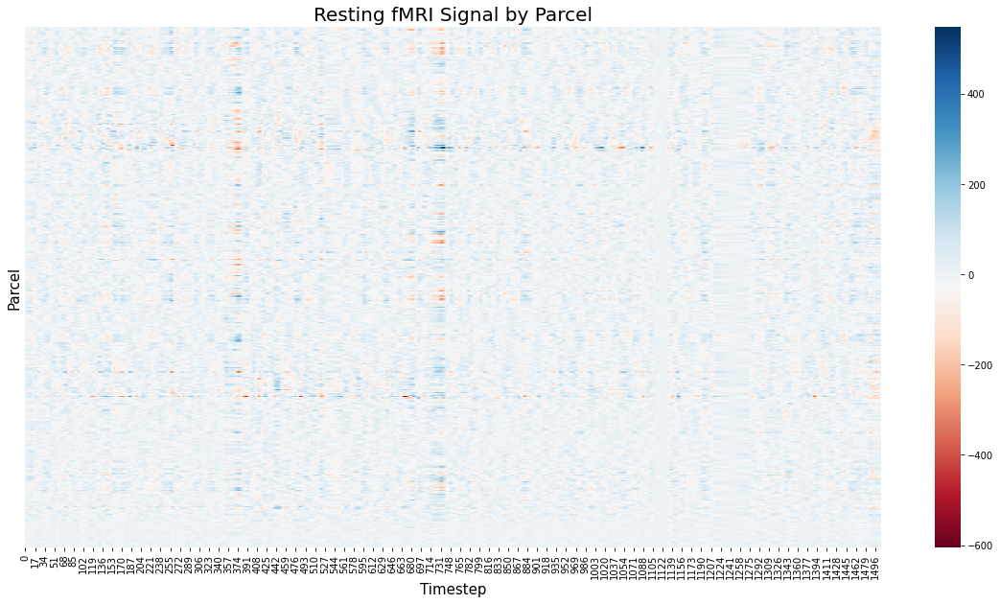

(379, 1507)
(1507, 379)


In [ ]:
# img = nib.load("/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/917255/rfMRI_REST1_LR/nogsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii")
img = nib.load("/gdrive/My Drive/CMI/Project/ABCD/func/sub-NDARINV1JXDFV9Z_ses-baselineYear1Arm1_task-rest_bold_atlas-HCP2016FreeSurferSubcortical_desc-filtered_timeseries.ptseries.nii")

data = np.array(img.get_fdata())
timesteps = 30
# displayed_data = np.transpose(data[range(timesteps),:])
displayed_data = np.transpose(data)
plt.subplots(figsize=(20,10))
ax = sns.heatmap(displayed_data, yticklabels=False, cmap = 'RdBu')

plt.title('Resting fMRI Signal by Parcel', fontsize = 20)
plt.ylabel('Parcel', fontsize = 15)
plt.xlabel('Timestep', fontsize = 15)
plt.show()
print(displayed_data.shape)
print(data.shape)

In [ ]:
import nibabel.cifti2.cifti2 as ci
from nibabel import cifti2
import nibabel as nib
import cifti 
import numpy as np

# cif_LR = cifti.read('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/917255/rfMRI_REST1_LR/nogsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii')
cif_LR = cifti.read("/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/retest_nogsr_103818_rfMRI_REST1_LR_Atlas_MSMAll_24nuisance.reg_lin.trend_filt_sm6.HCPSubcortical.ptseries.nii")

cif_RL = cifti.read('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/917255/rfMRI_REST1_RL/nogsr/rfMRI_REST1_RL_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii')

parcel_LR = []
parcel_RL = []
# fs5label = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_MMP_P210_10k.dlabel.nii')
fs5label = nib.load('/gdrive/My Drive/CMI/Project/ABCD/data/HCP2016FreeSurferSubcortical_dparc.dlabel.nii')

for i in range(378):
  parcel_LR.append(cif_LR[1][1][i][0])

for i in range(360):
  parcel_RL.append(cif_RL[1][1][i][0])
print(parcel_LR)
print(parcel_RL)

glasserlabel,(ax1,ax2) = cifti.read(fs5label)
ax1[0]

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


['R_V1_ROI', 'R_MST_ROI', 'R_V6_ROI', 'R_V2_ROI', 'R_V3_ROI', 'R_V4_ROI', 'R_V8_ROI', 'R_4_ROI', 'R_3b_ROI', 'R_FEF_ROI', 'R_PEF_ROI', 'R_55b_ROI', 'R_V3A_ROI', 'R_RSC_ROI', 'R_POS2_ROI', 'R_V7_ROI', 'R_IPS1_ROI', 'R_FFC_ROI', 'R_V3B_ROI', 'R_LO1_ROI', 'R_LO2_ROI', 'R_PIT_ROI', 'R_MT_ROI', 'R_A1_ROI', 'R_PSL_ROI', 'R_SFL_ROI', 'R_PCV_ROI', 'R_STV_ROI', 'R_7Pm_ROI', 'R_7m_ROI', 'R_POS1_ROI', 'R_23d_ROI', 'R_v23ab_ROI', 'R_d23ab_ROI', 'R_31pv_ROI', 'R_5m_ROI', 'R_5mv_ROI', 'R_23c_ROI', 'R_5L_ROI', 'R_24dd_ROI', 'R_24dv_ROI', 'R_7AL_ROI', 'R_SCEF_ROI', 'R_6ma_ROI', 'R_7Am_ROI', 'R_7PL_ROI', 'R_7PC_ROI', 'R_LIPv_ROI', 'R_VIP_ROI', 'R_MIP_ROI', 'R_1_ROI', 'R_2_ROI', 'R_3a_ROI', 'R_6d_ROI', 'R_6mp_ROI', 'R_6v_ROI', 'R_p24pr_ROI', 'R_33pr_ROI', 'R_a24pr_ROI', 'R_p32pr_ROI', 'R_a24_ROI', 'R_d32_ROI', 'R_8BM_ROI', 'R_p32_ROI', 'R_10r_ROI', 'R_47m_ROI', 'R_8Av_ROI', 'R_8Ad_ROI', 'R_9m_ROI', 'R_8BL_ROI', 'R_9p_ROI', 'R_10d_ROI', 'R_8C_ROI', 'R_44_ROI', 'R_45_ROI', 'R_47l_ROI', 'R_a47r_ROI', 'R_6r

('#1',
 {0: ('???', (1.0, 1.0, 1.0, 0.0)),
  1: ('R_V1_ROI', (0.270588, 0.0, 1.0, 1.0)),
  2: ('R_MST_ROI', (0.192157, 0.427451, 0.517647, 1.0)),
  3: ('R_V6_ROI', (0.290196, 0.352941, 0.705882, 1.0)),
  4: ('R_V2_ROI', (0.109804, 0.219608, 0.92549, 1.0)),
  5: ('R_V3_ROI', (0.0862745, 0.145098, 0.921569, 1.0)),
  6: ('R_V4_ROI', (0.0862745, 0.172549, 0.866667, 1.0)),
  7: ('R_V8_ROI', (0.105882, 0.266667, 0.831373, 1.0)),
  8: ('R_4_ROI', (0.133333, 0.709804, 0.109804, 1.0)),
  9: ('R_3b_ROI', (0.172549, 0.74902, 0.109804, 1.0)),
  10: ('R_FEF_ROI', (0.545098, 0.596078, 0.584314, 1.0)),
  11: ('R_PEF_ROI', (0.623529, 0.705882, 0.658824, 1.0)),
  12: ('R_55b_ROI', (0.443137, 0.423529, 0.317647, 1.0)),
  13: ('R_V3A_ROI', (0.0862745, 0.278431, 0.968627, 1.0)),
  14: ('R_RSC_ROI', (0.607843, 0.25098, 0.529412, 1.0)),
  15: ('R_POS2_ROI', (0.823529, 0.423529, 0.8, 1.0)),
  16: ('R_V7_ROI', (0.113725, 0.368627, 0.74902, 1.0)),
  17: ('R_IPS1_ROI', (0.243137, 0.521569, 0.678431, 1.0)),
  18

In [ ]:
img = nib.load("/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/retest_nogsr_103818_rfMRI_REST1_LR_Atlas_MSMAll_24nuisance.reg_lin.trend_filt_sm6.HCPSubcortical.ptseries.nii")
data = np.array(img.get_fdata())
#zscore
axis= 0
data = zscore(data,axis=axis) 
parcel_index = 0
X = data[0:tr,parcel_index]
# Y = data[0:tr,parcel_index+180]
Y = data[0:tr,361]

corr, ____= pearsonr(X, Y)
corr

NameError: ignored

array([[ 0.55903262,  0.35362805,  0.37547941, ...,  0.47547732,
         0.09978901,  0.42427338],
       [ 0.54821935,  0.50242904,  0.56339797, ...,  0.29497275,
         0.2380251 ,  0.18533476],
       [ 0.37874945,  0.31497212,  0.34393073, ...,  0.48479341,
         0.24209242,  0.29124981],
       ...,
       [ 0.59878046,  0.46551105,  0.50081188, ...,  1.        ,
         0.26978273,  0.36187645],
       [ 0.35008907,  0.42607503,  0.36823464, ...,  0.26978273,
         1.        , -0.14300458],
       [ 0.17945414, -0.01344117,  0.11281407, ...,  0.36187645,
        -0.14300458,  1.        ]])

In [ ]:
pearson_corr_append[0]

array([[ 0.55903262,  0.35362805,  0.37547941, ...,  0.47547732,
         0.09978901,  0.42427338],
       [ 0.54821935,  0.50242904,  0.56339797, ...,  0.29497275,
         0.2380251 ,  0.18533476],
       [ 0.37874945,  0.31497212,  0.34393073, ...,  0.48479341,
         0.24209242,  0.29124981],
       ...,
       [ 0.59878046,  0.46551105,  0.50081188, ...,  1.        ,
         0.26978273,  0.36187645],
       [ 0.35008907,  0.42607503,  0.36823464, ...,  0.26978273,
         1.        , -0.14300458],
       [ 0.17945414, -0.01344117,  0.11281407, ...,  0.36187645,
        -0.14300458,  1.        ]])

In [ ]:
results

array([[ 3.61000000e+02,  0.00000000e+00,  5.59032622e-01, ...,
         1.20000000e+03,  1.20000000e+03,  1.00000000e-03],
       [ 3.61000000e+02,  1.00000000e+00,  3.53628054e-01, ...,
         1.20000000e+03,  1.20000000e+03,  1.00000000e-03],
       [ 3.61000000e+02,  2.00000000e+00,  3.75479412e-01, ...,
         1.20000000e+03,  1.20000000e+03,  1.00000000e-03],
       ...,
       [ 3.77000000e+02,  3.75000000e+02,  3.61876446e-01, ...,
         1.20000000e+03,  1.20000000e+03,  1.00000000e-03],
       [ 3.77000000e+02,  3.76000000e+02, -1.43004581e-01, ...,
         6.24000000e+02,  6.83000000e+02,  1.00000000e-03],
       [ 3.77000000e+02,  3.77000000e+02,  1.00000000e+00, ...,
         1.20000000e+03,  1.20000000e+03,             nan]])

# Run mgc

## homo

### mgc

In [ ]:
# 07/04/20 HCP homotopic connectivity
# calculate one loop 

sub_id = [103818, 105923, 111312, 114823, 115320, 122317, 125525, 135528, 137128, 139839, 143325, 144226, 146129, 149337, 158035, 172332, 177746, 185442, 187547, 192439, 194140, 195041, 200109, 204521, 287248, 601127, 660951, 783462, 859671, 861456, 917255]
# Parameters.	
M = 0	    

tr = 1200

def worker(sub_index,parcel_index):	
    # test, nogsr
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_LR/nogsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_RL/nogsr/rfMRI_REST1_RL_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST2_LR/nogsr/rfMRI_REST2_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST2_RL/nogsr/rfMRI_REST2_RL_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    
    # retest, nogsr
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST1_LR/nogsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST1_RL/nogsr/rfMRI_REST1_RL_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST2_LR/nogsr/rfMRI_REST2_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST2_RL/nogsr/rfMRI_REST2_RL_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    
    # test, gsr
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_LR/gsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_RL/gsr/rfMRI_REST1_RL_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST2_LR/gsr/rfMRI_REST2_LR_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST2_RL/gsr/rfMRI_REST2_RL_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    
    # retest, gsr
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST1_LR/gsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST1_RL/gsr/rfMRI_REST1_RL_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST2_LR/gsr/rfMRI_REST2_LR_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST2_RL/gsr/rfMRI_REST2_RL_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    
    data = np.array(img.get_fdata())
    #zscore
    axis= 0
    data = zscore(data,axis=axis) 

    X = data[0:tr,parcel_index].reshape(tr, 1)
    Y = data[0:tr,parcel_index+180].reshape(tr, 1)

    mgcx = MGCX(max_lag = M)
    test_statistic, metadata = mgcx.test_statistic(X, Y)	
    optimal_lag = metadata['optimal_lag']	   
    optimal_scale_X = metadata['optimal_scale'][0]	
    optimal_scale_Y = metadata['optimal_scale'][1]		

    # fast-DCorr
    dcorr = DCorr()
    p_value, p_value_metadata = dcorr.p_value(X,Y,is_fast=True)	
    
    output = (sub_index, parcel_index, test_statistic, optimal_lag, optimal_scale_X, optimal_scale_Y, p_value)

    return(output)
	

result = Parallel(n_jobs=20, verbose=10)(delayed(worker)(sub_index,parcel_index) for sub_index in range(31) for parcel_index in range(180))	

# test, nogsr
# filename = 'hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST1_LR_nogsr.pkl' % (M,tr)	
filename = 'hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST1_RL_nogsr.pkl' % (M,tr)	
# filename = 'hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST2_LR_nogsr.pkl' % (M,tr)	
# filename = 'hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST2_RL_nogsr.pkl' % (M,tr)	

# retest, nogsr
# filename = 'hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST1_LR_nogsr.pkl' % (M,tr)	
# filename = 'hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST1_RL_nogsr.pkl' % (M,tr)	
# filename = 'hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST2_LR_nogsr.pkl' % (M,tr)	
# filename = 'hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST2_RL_nogsr.pkl' % (M,tr)

# test, gsr
# filename = 'hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST1_LR_gsr.pkl' % (M,tr)	
# filename = 'hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST1_RL_gsr.pkl' % (M,tr)	
# filename = 'hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST2_LR_gsr.pkl' % (M,tr)	
# filename = 'hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST2_RL_gsr.pkl' % (M,tr)	

# retest, gsr
# filename = 'hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST1_LR_gsr.pkl' % (M,tr)	
# filename = 'hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST1_RL_gsr.pkl' % (M,tr)	
# filename = 'hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST2_LR_gsr.pkl' % (M,tr)	
# filename = 'hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST2_RL_gsr.pkl' % (M,tr)


output_file = open(filename, 'wb')	
pickle.dump(result, output_file)	
output_file.close()

from google.colab import files
# test, nogsr
# files.download('hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST1_LR_nogsr.pkl' % (M,tr)	)
files.download('hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST1_RL_nogsr.pkl' % (M,tr)	)
# files.download('hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST2_LR_nogsr.pkl' % (M,tr)	)
# files.download('hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST2_RL_nogsr.pkl' % (M,tr)	)

# retest, nogsr
# files.download('hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST1_LR_nogsr.pkl' % (M,tr)	)
# files.download('hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST1_RL_nogsr.pkl' % (M,tr)	)
# files.download('hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST2_LR_nogsr.pkl' % (M,tr)	)
# files.download('hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST2_RL_nogsr.pkl' % (M,tr)	)

# test, gsr
# files.download('hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST1_LR_gsr.pkl' % (M,tr)	)
# files.download('hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST1_RL_gsr.pkl' % (M,tr)	)
# files.download('hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST2_LR_gsr.pkl' % (M,tr)	)
# files.download('hcp_homo_connect_lag%d_tr%d_test_rfMRI_REST2_RL_gsr.pkl' % (M,tr)	)

# retest, gsr
# files.download('hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST1_LR_gsr.pkl' % (M,tr)	)
# files.download('hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST1_RL_gsr.pkl' % (M,tr)	)
# files.download('hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST2_LR_gsr.pkl' % (M,tr)	)
# files.download('hcp_homo_connect_lag%d_tr%d_retest_rfMRI_REST2_RL_gsr.pkl' % (M,tr)	)

[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done   1 tasks      | elapsed:   10.7s
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:   11.0s
[Parallel(n_jobs=20)]: Done  21 tasks      | elapsed:   20.2s
[Parallel(n_jobs=20)]: Done  32 tasks      | elapsed:   20.8s
[Parallel(n_jobs=20)]: Done  45 tasks      | elapsed:   30.2s
[Parallel(n_jobs=20)]: Done  58 tasks      | elapsed:   30.8s
[Parallel(n_jobs=20)]: Done  73 tasks      | elapsed:   40.3s
[Parallel(n_jobs=20)]: Done  88 tasks      | elapsed:   49.8s
[Parallel(n_jobs=20)]: Done 105 tasks      | elapsed:   59.1s


### pearson

In [ ]:
# 07/04/20 HCP homotopic connectivity
# Pearsonr 

sub_id = [103818, 105923, 111312, 114823, 115320, 122317, 125525, 135528, 137128, 139839, 143325, 144226, 146129, 149337, 158035, 172332, 177746, 185442, 187547, 192439, 194140, 195041, 200109, 204521, 287248, 601127, 660951, 783462, 859671, 861456, 917255]
# Parameters.	
M = 0	    

tr = 1200

def worker(sub_index,parcel_index):	
    # test, nogsr
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_LR/nogsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_RL/nogsr/rfMRI_REST1_RL_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST2_LR/nogsr/rfMRI_REST2_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST2_RL/nogsr/rfMRI_REST2_RL_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    
    # retest, nogsr
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST1_LR/nogsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST1_RL/nogsr/rfMRI_REST1_RL_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST2_LR/nogsr/rfMRI_REST2_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST2_RL/nogsr/rfMRI_REST2_RL_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    
    # test, gsr
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_LR/gsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_RL/gsr/rfMRI_REST1_RL_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST2_LR/gsr/rfMRI_REST2_LR_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST2_RL/gsr/rfMRI_REST2_RL_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    
    # retest, gsr
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST1_LR/gsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST1_RL/gsr/rfMRI_REST1_RL_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST2_LR/gsr/rfMRI_REST2_LR_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/retest/%s/rfMRI_REST2_RL/gsr/rfMRI_REST2_RL_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    

    data = np.array(img.get_fdata())
    #zscore
    axis= 0
    data = zscore(data,axis=axis) 

    X = data[0:tr,parcel_index]
    Y = data[0:tr,parcel_index+180]

    pearson_corr, ____= pearsonr(X, Y)		

    output = (sub_index, parcel_index, pearson_corr)
    return(output)
	

result = Parallel(n_jobs=50, verbose=10)(delayed(worker)(sub_index,parcel_index) for sub_index in range(31) for parcel_index in range(180))	
# test, nogsr
# filename = 'hcp_homo_connect_pearson_tr%d_test_rfMRI_REST1_LR_nogsr.pkl' % tr	
# filename = 'hcp_homo_connect_pearson_tr%d_test_rfMRI_REST1_RL_nogsr.pkl' % tr	
# filename = 'hcp_homo_connect_pearson_tr%d_test_rfMRI_REST2_LR_nogsr.pkl' % tr	
# filename = 'hcp_homo_connect_pearson_tr%d_test_rfMRI_REST2_RL_nogsr.pkl' % tr	

# retest, nogsr
# filename = 'hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST1_LR_nogsr.pkl' % tr	
# filename = 'hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST1_RL_nogsr.pkl' % tr	
# filename = 'hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST2_LR_nogsr.pkl' % tr	
# filename = 'hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST2_RL_nogsr.pkl' % tr	

# test, gsr
# filename = 'hcp_homo_connect_pearson_tr%d_test_rfMRI_REST1_LR_gsr.pkl' % tr	
# filename = 'hcp_homo_connect_pearson_tr%d_test_rfMRI_REST1_RL_gsr.pkl' % tr	
# filename = 'hcp_homo_connect_pearson_tr%d_test_rfMRI_REST2_LR_gsr.pkl' % tr	
# filename = 'hcp_homo_connect_pearson_tr%d_test_rfMRI_REST2_RL_gsr.pkl' % tr	

# retest, gsr
# filename = 'hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST1_LR_gsr.pkl' % tr	
# filename = 'hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST1_RL_gsr.pkl' % tr	
# filename = 'hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST2_LR_gsr.pkl' % tr	
filename = 'hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST2_RL_gsr.pkl' % tr	

output_file = open(filename, 'wb')	
pickle.dump(result, output_file)	
output_file.close()

from google.colab import files
# test, nogsr
# files.download('hcp_homo_connect_pearson_tr%d_test_rfMRI_REST1_LR_nogsr.pkl' % tr)
# files.download('hcp_homo_connect_pearson_tr%d_test_rfMRI_REST1_RL_nogsr.pkl' % tr)
# files.download('hcp_homo_connect_pearson_tr%d_test_rfMRI_REST2_LR_nogsr.pkl' % tr)
# files.download('hcp_homo_connect_pearson_tr%d_test_rfMRI_REST2_RL_nogsr.pkl' % tr)

# retest, nogsr
# files.download('hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST1_LR_nogsr.pkl' % tr)
# files.download('hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST1_RL_nogsr.pkl' % tr)
# files.download('hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST2_LR_nogsr.pkl' % tr)
# files.download('hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST2_RL_nogsr.pkl' % tr)

# test, gsr
# files.download('hcp_homo_connect_pearson_tr%d_test_rfMRI_REST1_LR_gsr.pkl' % tr)
# files.download('hcp_homo_connect_pearson_tr%d_test_rfMRI_REST1_RL_gsr.pkl' % tr)
# files.download('hcp_homo_connect_pearson_tr%d_test_rfMRI_REST2_LR_gsr.pkl' % tr)
# files.download('hcp_homo_connect_pearson_tr%d_test_rfMRI_REST2_RL_gsr.pkl' % tr)

# retest, gsr
# files.download('hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST1_LR_gsr.pkl' % tr)
# files.download('hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST1_RL_gsr.pkl' % tr)
# files.download('hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST2_LR_gsr.pkl' % tr)
files.download('hcp_homo_connect_pearson_tr%d_retest_rfMRI_REST2_RL_gsr.pkl' % tr)

## DMN

### mgc

In [ ]:
# 07/04/20 HCP 
# DMN-one parcel to whole brain

sub_id = [103818, 105923, 111312, 114823, 115320, 122317, 125525, 135528, 137128, 139839, 143325, 144226, 146129, 149337, 158035, 172332, 177746, 185442, 187547, 192439, 194140, 195041, 200109, 204521, 287248, 601127, 660951, 783462, 859671, 861456, 917255]
# Parameters.	
M = 0	    
tr = 1200
target_parcel = 34 #parcel: 35: 'R_31pv_ROI'

def worker(sub_index,parcel_index):	
    img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_LR/nogsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    data = np.array(img.get_fdata())
    #zscore
    axis= 0
    data = zscore(data,axis=axis) 

    X = data[0:tr,target_parcel].reshape(tr, 1) 
    Y = data[0:tr,parcel_index].reshape(tr, 1)

    mgcx = MGCX(max_lag = M)
    test_statistic, metadata = mgcx.test_statistic(X, Y)	
    optimal_lag = metadata['optimal_lag']	   
    optimal_scale_X = metadata['optimal_scale'][0]	
    optimal_scale_Y = metadata['optimal_scale'][1]		

    # fast-DCorr
    dcorr = DCorr()
    p_value, p_value_metadata = dcorr.p_value(X,Y,is_fast=True)	

    output = (sub_index, parcel_index, test_statistic, optimal_lag, optimal_scale_X, optimal_scale_Y, p_value) 

    return(output)
	

result = Parallel(n_jobs=200, verbose=10)(delayed(worker)(sub_index, parcel_index) for sub_index in range(22) for parcel_index in range(360))	

filename = 'hcp_R_31pv_connect_lag%d_tr%d_test_rfMRI_REST1_LR_nogsr.pkl' % (M,tr)

output_file = open(filename, 'wb')	
pickle.dump(result, output_file)	
output_file.close()

from google.colab import files
files.download('hcp_R_31pv_connect_lag%d_tr%d_test_rfMRI_REST1_LR_nogsr.pkl' % (M,tr))

### pearson

In [ ]:
# 07/04/20 HCP 
# DMN-one parcel to whole brain

sub_id = [103818, 105923, 111312, 114823, 115320, 122317, 125525, 135528, 137128, 139839, 143325, 144226, 146129, 149337, 158035, 172332, 177746, 185442, 187547, 192439, 194140, 195041, 200109, 204521, 287248, 601127, 660951, 783462, 859671, 861456, 917255]
# Parameters.	
M = 0	    
tr = 1200
target_parcel = 34 #parcel: 35: 'R_31pv_ROI'

def worker(sub_index,parcel_index):	
    img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_LR/nogsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    data = np.array(img.get_fdata())
    #zscore
    axis= 0
    data = zscore(data,axis=axis) 

    X = data[0:tr,target_parcel] #if pearsonr, delete reshape
    Y = data[0:tr,parcel_index]

    # pearson
    pearson_corr, ____= pearsonr(X,Y)		
    output = (sub_index, parcel_index, pearson_corr)

    return(output)
	

result = Parallel(n_jobs=200, verbose=10)(delayed(worker)(sub_index, parcel_index) for sub_index in range(31) for parcel_index in range(360))	

filename = 'hcp_R_31pv_connect_pearson_tr%d_test_rfMRI_REST1_LR_nogsr.pkl' % tr

output_file = open(filename, 'wb')	
pickle.dump(result, output_file)	
output_file.close()

from google.colab import files
files.download('hcp_R_31pv_connect_pearson_tr%d_test_rfMRI_REST1_LR_nogsr.pkl' % tr)

In [ ]:
# 07/04/2020 hcp homo connectivity 180
p = 360
tr = 1200
sub_list_length = 31
test_statistic = np.zeros((sub_list_length,p))
pearson_corr = np.zeros((sub_list_length,p))
optimal_scale_X = np.zeros((sub_list_length,p))
optimal_scale_Y = np.zeros((sub_list_length,p))
p_value = np.zeros((sub_list_length,p))
optimal_lag = np.zeros((sub_list_length,p))

# Read files and combine into matrix.
trt = ['test', 'retest']
ses = ['rfMRI_REST1_LR', 'rfMRI_REST1_RL','rfMRI_REST2_LR','rfMRI_REST2_RL']
trt_id = 'test'
ses_id = 'rfMRI_REST1_LR'
filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/DMN/pearson/test/nogsr/hcp_R_31pv_connect_pearson_tr%d_%s_%s_nogsr.pkl" % (tr,trt_id,ses_id)

pickle_in = open(filename,"rb")
results = np.asarray(pickle.load(pickle_in))

for result in results:
    # output = (sub_index, parcel_index, pearson_corr)
    k = int(result[0])
    l = int(result[1])
    pearson_corr[k,l] = result[2] 


# read data


## homo

In [ ]:
# 07/04/2020 hcp homo connectivity 180

p = 180         #180
tr = 1200
sub_list_length = 31      

test_statistic_append = []
optimal_scale_X_append = []
optimal_scale_Y_append = []
p_value_append = []
p_value_sig_binary_append = []
pearson_corr_append = []
optimal_scale_X_nonlinear_binary_append = []

threshold_nonlinear=(tr - np.sqrt(tr))/tr

M = 0
# Read files and combine into matrix.
# trt = ['test', 'retest']
# ses = ['rfMRI_REST1_LR', 'rfMRI_REST1_RL','rfMRI_REST2_LR','rfMRI_REST2_RL']
trt = ['test']
ses = ['rfMRI_REST1_LR', 'rfMRI_REST2_LR']
for trt_id in trt:
  for ses_id in ses:
    test_statistic = np.zeros((sub_list_length,p))
    pearson_corr = np.zeros((sub_list_length,p))
    optimal_scale_X = np.zeros((sub_list_length,p))
    optimal_scale_Y = np.zeros((sub_list_length,p))
    p_value = np.zeros((sub_list_length,p))
    optimal_lag = np.zeros((sub_list_length,p))
    p_value_sig_binary = np.zeros((sub_list_length,p))
    optimal_scale_X_nonlinear_binary = np.zeros((sub_list_length,p))

    # nogsr
    filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/homo/mgc/%s/nogsr/hcp_homo_connect_lag%d_tr%d_%s_%s_nogsr.pkl" % (trt_id,M,tr,trt_id,ses_id)
    # gsr
    # filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/homo/mgc/%s/gsr/hcp_homo_connect_lag%d_tr%d_%s_%s_gsr.pkl" % (trt_id,M,tr,trt_id,ses_id)
    pickle_in = open(filename,"rb")
    results = np.asarray(pickle.load(pickle_in))
    for result in results:
        # (sub_index, parcel_index, test_statistic, optimal_lag, optimal_scale_X, optimal_scale_Y,p_value)
        k = int(result[0])
        l = int(result[1])
        test_statistic[k,l] = result[2] 
        optimal_lag[k,l] = result[3]
        optimal_scale_X[k,l] = result[4] / tr
        optimal_scale_Y[k,l] = result[5] / tr
        p_value[k,l] = result[6]
        if -np.log10(result[6]) >= 3:
          p_value_sig_binary[k,l] = 1
        else:
          p_value_sig_binary[k,l] = 0
        if result[4] / tr >= threshold_nonlinear:
          optimal_scale_X_nonlinear_binary[k,l] = 0
        else:
          optimal_scale_X_nonlinear_binary[k,l] = 1

    # pearson
    # nogsr
    filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/homo/pearson/%s/nogsr/hcp_homo_connect_pearson_tr%d_%s_%s_nogsr.pkl" % (trt_id,tr,trt_id,ses_id)
    # gsr
    # filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/homo/pearson/%s/gsr/hcp_homo_connect_pearson_tr%d_%s_%s_gsr.pkl" % (trt_id,tr,trt_id,ses_id)
    pickle_in = open(filename,"rb")
    results = np.asarray(pickle.load(pickle_in))
    for result in results:
        # output = (sub_index, parcel_index, pearson_corr)
        k = int(result[0])
        l = int(result[1])
        pearson_corr[k,l] = result[2]

    # exclude: sub_index = 10, sub_id[sub_index] = 143325 -> retest, rfMRI_REST2_RL, 143325, datashape (939, 360)
    test_statistic = np.delete(test_statistic, (10), axis=0)
    optimal_scale_X = np.delete(optimal_scale_X, (10), axis=0)
    optimal_scale_Y = np.delete(optimal_scale_Y, (10), axis=0)
    p_value = np.delete(p_value, (10), axis=0)
    p_value_sig_binary = np.delete(p_value_sig_binary, (10), axis=0)
    pearson_corr = np.delete(pearson_corr, (10), axis=0)
    optimal_scale_X_nonlinear_binary = np.delete(optimal_scale_X_nonlinear_binary, (10), axis=0)
    
    test_statistic_append.append(test_statistic)
    optimal_scale_X_append.append(optimal_scale_X)
    optimal_scale_Y_append.append(optimal_scale_Y)
    p_value_append.append(p_value)
    p_value_sig_binary_append.append(p_value_sig_binary)
    pearson_corr_append.append(pearson_corr)
    optimal_scale_X_nonlinear_binary_append.append(optimal_scale_X_nonlinear_binary)
    

test_statistic_all = np.vstack(test_statistic_append)
optimal_scale_X_all = np.vstack(optimal_scale_X_append)
optimal_scale_Y_all = np.vstack(optimal_scale_Y_append)
p_value_all = np.vstack(p_value_append)
p_value_sig_binary_all = np.vstack(p_value_sig_binary_append)
pearson_corr_all = np.vstack(pearson_corr_append)
optimal_scale_X_nonlinear_binary_all = np.vstack(optimal_scale_X_nonlinear_binary_append)
optimal_scale_diff = abs(optimal_scale_X_nonlinear_binary_append[0]-optimal_scale_X_nonlinear_binary_append[1])

In [ ]:
test_statistic_append_nogsr = test_statistic_append
optimal_scale_X_append_nogsr= optimal_scale_X_append
optimal_scale_Y_append_nogsr= optimal_scale_Y_append
p_value_append_nogsr=p_value_append
pearson_corr_append_nogsr=pearson_corr_append
optimal_scale_X_nonlinear_binary_append_nogsr= optimal_scale_X_nonlinear_binary_append


In [ ]:
test_statistic_append_gsr = test_statistic_append
optimal_scale_X_append_gsr= optimal_scale_X_append
optimal_scale_Y_append_gsr= optimal_scale_Y_append
p_value_append_gsr=p_value_append
pearson_corr_append_gsr=pearson_corr_append
optimal_scale_X_nonlinear_binary_append_gsr= optimal_scale_X_nonlinear_binary_append


## dmn

In [ ]:
# 07/13/2020 hcp dmn connectivity 180

p = 360         
tr = 1200
sub_list_length = 30      

test_statistic_append = []
optimal_scale_X_append = []
optimal_scale_Y_append = []
p_value_append = []
p_value_sig_binary_append = []
pearson_corr_append = []
optimal_scale_X_nonlinear_binary_append = []

threshold_nonlinear=(tr - np.sqrt(tr))/tr

M = 0
# Read files and combine into matrix.
trt = ['test']
ses = ['rfMRI_REST1_LR', 'rfMRI_REST2_LR']
for trt_id in trt:
  for ses_id in ses:
    test_statistic = np.zeros((sub_list_length,p))
    pearson_corr = np.zeros((sub_list_length,p))
    optimal_scale_X = np.zeros((sub_list_length,p))
    optimal_scale_Y = np.zeros((sub_list_length,p))
    p_value = np.zeros((sub_list_length,p))
    optimal_lag = np.zeros((sub_list_length,p))
    p_value_sig_binary = np.zeros((sub_list_length,p))
    optimal_scale_X_nonlinear_binary = np.zeros((sub_list_length,p))

    # nogsr
    filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/DMN/mgc/%s/nogsr/hcp_R_31pv_connect_lag%d_tr%d_%s_%s_nogsr.pkl" % (trt_id,M,tr,trt_id,ses_id)
    # gsr
    # filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/DMN/mgc/%s/gsr/hcp_R_31pv_connect_lag%d_tr%d_%s_%s_gsr.pkl" % (trt_id,M,tr,trt_id,ses_id)
    pickle_in = open(filename,"rb")
    results = np.asarray(pickle.load(pickle_in))
    for result in results:
        # (sub_index, parcel_index, test_statistic, optimal_lag, optimal_scale_X, optimal_scale_Y,p_value)
        k = int(result[0])
        l = int(result[1])
        test_statistic[k,l] = result[2] 
        optimal_lag[k,l] = result[3]
        optimal_scale_X[k,l] = result[4] / tr
        optimal_scale_Y[k,l] = result[5] / tr
        p_value[k,l] = result[6]
        if -np.log10(result[6]) >= 3:
          p_value_sig_binary[k,l] = 1
        else:
          p_value_sig_binary[k,l] = 0
        if result[4] / tr >= threshold_nonlinear:
          optimal_scale_X_nonlinear_binary[k,l] = 0
        else:
          optimal_scale_X_nonlinear_binary[k,l] = 1

    # pearson
    # nogsr
    filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/DMN/pearson/%s/nogsr/hcp_R_31pv_connect_pearson_tr%d_%s_%s_nogsr.pkl" % (trt_id,tr,trt_id,ses_id)
    # gsr
    # filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/DMN/pearson/%s/gsr/hcp_R_31pv_connect_pearson_tr%d_%s_%s_gsr.pkl" % (trt_id,tr,trt_id,ses_id)
    pickle_in = open(filename,"rb")
    results = np.asarray(pickle.load(pickle_in))
    for result in results:
        # output = (sub_index, parcel_index, pearson_corr)
        k = int(result[0])
        l = int(result[1])
        pearson_corr[k,l] = result[2]

    test_statistic_append.append(test_statistic)
    optimal_scale_X_append.append(optimal_scale_X)
    optimal_scale_Y_append.append(optimal_scale_Y)
    p_value_append.append(p_value)
    p_value_sig_binary_append.append(p_value_sig_binary)
    pearson_corr_append.append(pearson_corr)
    optimal_scale_X_nonlinear_binary_append.append(optimal_scale_X_nonlinear_binary)
    

test_statistic_all = np.vstack(test_statistic_append)
optimal_scale_X_all = np.vstack(optimal_scale_X_append)
optimal_scale_Y_all = np.vstack(optimal_scale_Y_append)
p_value_all = np.vstack(p_value_append)
p_value_sig_binary_all = np.vstack(p_value_sig_binary_append)
pearson_corr_all = np.vstack(pearson_corr_append)
optimal_scale_X_nonlinear_binary_all = np.vstack(optimal_scale_X_nonlinear_binary_append)
optimal_scale_diff = abs(optimal_scale_X_nonlinear_binary_append[0]-optimal_scale_X_nonlinear_binary_append[1])

## subcortical

In [ ]:
# 09/28/20 hcp test-retest 14*374
# subcortical - to - cortical 
# exclude CEREBELLUM(361,371), BRAIN_STEM(366), DIENCEPHALON_VENTRAL(370,379)

parcel_len = 374
parcel_subcor_len = 14     
tr = 1200   

test_statistic_append = []
optimal_scale_X_append = []
optimal_scale_Y_append = []
p_value_append = []
p_value_sig_binary_append = []
pearson_corr_append = []
optimal_scale_X_nonlinear_binary_append = []

threshold_nonlinear=(tr - np.sqrt(tr))/tr

M = 0

sub_id = ['retest_nogsr_103818_rfMRI_REST1_LR']


for sub_i in sub_id:
    pearson_corr = np.zeros((parcel_subcor_len,parcel_len))
    test_statistic = np.zeros((parcel_subcor_len,parcel_len))
    optimal_scale_X = np.zeros((parcel_subcor_len,parcel_len))
    optimal_scale_Y = np.zeros((parcel_subcor_len,parcel_len))
    p_value = np.zeros((parcel_subcor_len,parcel_len))
    p_value_sig_binary = np.zeros((parcel_subcor_len,parcel_len))
    optimal_scale_X_nonlinear_binary = np.zeros((parcel_subcor_len,parcel_len))

    filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/subcortical/%s_14_374_lag%d.pkl" % (sub_i, M)

    pickle_in = open(filename,"rb")
    results = np.asarray(pickle.load(pickle_in))
    for result in results:
        # (parcel_index_subcor, parcel_index_all, pearson_corr, test_statistic, optimal_scale_X, optimal_scale_Y, p_value)
        # exclude CEREBELLUM(361,371), BRAIN_STEM(366), DIENCEPHALON_VENTRAL(370,379)
        # parcel_id_python_subcor =  [361, 362, 363, 364, 366, 367, 368, 371, 372, 373, 374, 375, 376, 377]
        if 361<=result[0]<=364 :
          k = int(result[0])-361
        elif 366<=result[0]<=368 :
          k = int(result[0])-362
        elif 371<=result[0]<=377 :
          k = int(result[0])-364
          
        if 361<=result[1]<=364 :
          l = int(result[1])-1
        elif 366<=result[1]<=368 :
          l = int(result[1])-2
        elif 371<=result[1]<=377 :
          l = int(result[1])-4
        else:
          l = int(result[1])          

        pearson_corr [k,l] = result[2] 
        test_statistic[k,l] = result[3] 
        optimal_scale_X[k,l] = result[4] / tr
        optimal_scale_Y[k,l] = result[5] / tr
        p_value[k,l] = result[6]
        if -np.log10(result[6]) >= 3:
          p_value_sig_binary[k,l] = 1
        else:
          p_value_sig_binary[k,l] = 0
        if result[4] / tr >= threshold_nonlinear:
          optimal_scale_X_nonlinear_binary[k,l] = 0
        else:
          optimal_scale_X_nonlinear_binary[k,l] = 1

    test_statistic_append.append(test_statistic)
    optimal_scale_X_append.append(optimal_scale_X)
    optimal_scale_Y_append.append(optimal_scale_Y)
    p_value_append.append(p_value)
    p_value_sig_binary_append.append(p_value_sig_binary)
    pearson_corr_append.append(pearson_corr)
    optimal_scale_X_nonlinear_binary_append.append(optimal_scale_X_nonlinear_binary)


test_statistic_all = np.vstack(test_statistic_append)
optimal_scale_X_all = np.vstack(optimal_scale_X_append)
optimal_scale_Y_all = np.vstack(optimal_scale_Y_append)
p_value_all = np.vstack(p_value_append)
p_value_sig_binary_all = np.vstack(p_value_sig_binary_append)
pearson_corr_all = np.vstack(pearson_corr_append)
optimal_scale_X_nonlinear_binary_all = np.vstack(optimal_scale_X_nonlinear_binary_append)
# optimal_scale_diff = abs(optimal_scale_X_nonlinear_binary_append[0]-optimal_scale_X_nonlinear_binary_append[1])

# output should be subjects * (14*374)

In [ ]:
results

array([[ 3.61000000e+02,  0.00000000e+00,  5.59032622e-01, ...,
         1.20000000e+03,  1.20000000e+03,  1.00000000e-03],
       [ 3.61000000e+02,  1.00000000e+00,  3.53628054e-01, ...,
         1.20000000e+03,  1.20000000e+03,  1.00000000e-03],
       [ 3.61000000e+02,  2.00000000e+00,  3.75479412e-01, ...,
         1.20000000e+03,  1.20000000e+03,  1.00000000e-03],
       ...,
       [ 3.77000000e+02,  3.75000000e+02,  3.61876446e-01, ...,
         1.20000000e+03,  1.20000000e+03,  1.00000000e-03],
       [ 3.77000000e+02,  3.76000000e+02, -1.43004581e-01, ...,
         6.24000000e+02,  6.83000000e+02,  1.00000000e-03],
       [ 3.77000000e+02,  3.77000000e+02,  1.00000000e+00, ...,
         1.20000000e+03,  1.20000000e+03,             nan]])

In [ ]:
pearson_corr_by_parcel[0]

array([[ 0.55903262,  0.35362805,  0.37547941,  0.50833846,  0.51323115,
         0.47181088,  0.35971739,  0.44753868,  0.54479962,  0.48376676,
         0.52191978,  0.49325599,  0.48023485,  0.6859551 ,  0.49354   ,
         0.34235863,  0.34913624,  0.36391311,  0.44632997,  0.37342088,
         0.40984878,  0.45945648,  0.29802575,  0.50506664,  0.38538358,
         0.39663183,  0.45129237,  0.46347653,  0.36911332,  0.37192406,
         0.44302545,  0.58217075,  0.58457397,  0.61567075,  0.53231819,
         0.39531748,  0.51446583,  0.61691059,  0.52818203,  0.39612443,
         0.51497239,  0.41255462,  0.43339797,  0.37979056,  0.3658371 ,
         0.44792263,  0.37323263,  0.42872613,  0.36631721,  0.46190557,
         0.50637992,  0.45313285,  0.50311927,  0.41074174,  0.36128579,
         0.37923931,  0.62484602,  0.47218098,  0.58728713,  0.55642656,
         0.53475143,  0.5574519 ,  0.48606412,  0.48981674,  0.2575219 ,
         0.35326691,  0.5037776 ,  0.53264818,  0.4

In [ ]:
optimal_scale_X_append[0].shape

(14, 374)

In [ ]:
pearson_corr_by_parcel = []
test_statistic_by_parcel = [] #14*(4*374)
optimal_scale_X_by_parcel = []
optimal_scale_X_nonlinear_binary_by_parcel = []
for j in range(parcel_subcor_len):
  pearson_corr_one_parcel = []
  test_statistic_one_parcel = []
  optimal_scale_X_one_parcel = []
  optimal_scale_X_nonlinear_binary_one_parcel = []
  for i in range(len(sub_id)):
    pearson_corr_one_parcel.append(pearson_corr_append[i][j])
    test_statistic_one_parcel.append(test_statistic_append[i][j])
    optimal_scale_X_one_parcel.append(optimal_scale_X_append[i][j])
    optimal_scale_X_nonlinear_binary_one_parcel.append(optimal_scale_X_nonlinear_binary_append[i][j])

  pearson_corr_by_parcel.append(np.vstack(pearson_corr_one_parcel))
  test_statistic_by_parcel.append(np.vstack(test_statistic_one_parcel))
  optimal_scale_X_by_parcel.append(np.vstack(optimal_scale_X_one_parcel))
  optimal_scale_X_nonlinear_binary_by_parcel.append(np.vstack(optimal_scale_X_nonlinear_binary_one_parcel))

In [ ]:
pearson_corr_append[0]

array([[ 0.55903262,  0.35362805,  0.37547941, ...,  0.47547732,
         0.09978901,  0.42427338],
       [ 0.54821935,  0.50242904,  0.56339797, ...,  0.29497275,
         0.2380251 ,  0.18533476],
       [ 0.37874945,  0.31497212,  0.34393073, ...,  0.48479341,
         0.24209242,  0.29124981],
       ...,
       [ 0.59878046,  0.46551105,  0.50081188, ...,  1.        ,
         0.26978273,  0.36187645],
       [ 0.35008907,  0.42607503,  0.36823464, ...,  0.26978273,
         1.        , -0.14300458],
       [ 0.17945414, -0.01344117,  0.11281407, ...,  0.36187645,
        -0.14300458,  1.        ]])

In [ ]:
pearson_corr_by_parcel[0].shape

(1, 374)

# plot


## homo-heatmap

In [ ]:
# Read the specific ROIs needed for analysis.
roi = pd.read_csv("/gdrive/My Drive/CMI/Project/MGCX/data/HCPMMP_To_Yeo7_LR.csv")
# roi_labels = np.asarray(roi[180:360]["Yeo7Network_keys"]) #right Y
roi_labels = np.asarray(roi[0:180]["Yeo7Network_keys"]) #left X

In [ ]:
for trt_i, trt_id in enumerate(trt):
  for ses_j,ses_id in enumerate(ses):
      if trt_i == 0:
        print(ses_j)
      if trt_i == 1:
        print(ses_j+len(ses))

      print(trt_i, trt_id, ses_j,ses_id)

0
0 test 0 rfMRI_REST1_LR
1
0 test 1 rfMRI_REST1_RL
2
0 test 2 rfMRI_REST2_LR
3
0 test 3 rfMRI_REST2_RL
4
1 retest 0 rfMRI_REST1_LR
5
1 retest 1 rfMRI_REST1_RL
6
1 retest 2 rfMRI_REST2_LR
7
1 retest 3 rfMRI_REST2_RL


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:42: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:42: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:42: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version,

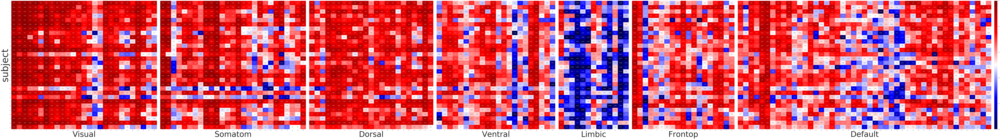

In [ ]:
# trt = ['test', 'retest']
# ses = ['rfMRI_REST1_LR', 'rfMRI_REST1_RL','rfMRI_REST2_LR','rfMRI_REST2_RL']
trt = ['test']
ses = ['rfMRI_REST1_LR', 'rfMRI_REST2_LR']
%matplotlib notebook
%matplotlib inline
sub_list_length = 30  # Ting31.list - exclude one subject

cmap = 'seismic' #'seismic','gnuplot','binary'
vmax = 1
vmin = 0

for trt_i, trt_id in enumerate(trt):
  for ses_j,ses_id in enumerate(ses):
    roi = [[]]*7
    for k in range(7): 
      roi[k] = np.zeros((sub_list_length, np.count_nonzero(roi_labels == k+1)))
      for i in range(sub_list_length):
        mask = np.where(roi_labels==k+1)
        # roi[k][i] = -np.log10(p_value)[i][mask]
        if trt_i == 0:
          data_roi = pearson_corr_append[ses_j]
        if trt_i == 1:
          data_roi = pearson_corr_append[ses_j+len(ses)]
        roi[k][i] = data_roi[i][mask]

    roi_label_name=['Visual','Somatom','Dorsal','Ventral','Limbic','Frontop', 'Default']

    sns.set(rc={'figure.figsize':(180,25)})  
    fig = plt.figure(constrained_layout=True)
    # fig.suptitle(trt_id+' '+ ses_id , fontsize=16)

    widths = []
    for k in range(7):
      widths = np.append(widths, roi[k].shape[1])

    heights = [sub_list_length]
    spec = fig.add_gridspec(ncols=7, nrows=1, width_ratios=widths, height_ratios=heights)

    # optimal scale
    for col in range(7):
        ax = fig.add_subplot(spec[0, col])
        if col in range(1,6):
          g = sns.heatmap(roi[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin,cbar=False)
          g.set(yticklabels=[])
        if col==0:
          g = sns.heatmap(roi[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin,cbar=False)
          ax.set_ylabel('subject', fontsize = 120) #ax.set_ylabel('Subject', fontsize = 80) 
        if col == 6:
          g = sns.heatmap(roi[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin, cbar=True, cbar_kws={'aspect':300,'pad':0.01}) #pad=0.01, shrink=0.8, fraction=0.1
          g.set(yticklabels=[])
          # g.tick_params(labelsize=60)
        ax.set_xlabel(str(roi_label_name[col]), fontsize = 100) #fontsize = 80



## dmn-heatmap

In [ ]:
# Read the specific ROIs needed for analysis.
roi = pd.read_csv("/gdrive/My Drive/CMI/Project/MGCX/data/HCPMMP_To_Yeo7_LR.csv")
roi_labels_R = np.asarray(roi[180:360]["Yeo7Network_keys"]) #right Y
roi_labels_L = np.asarray(roi[0:180]["Yeo7Network_keys"]) #left X
roi_labels = np.asarray(roi["Yeo7Network_keys"]) # all

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version,

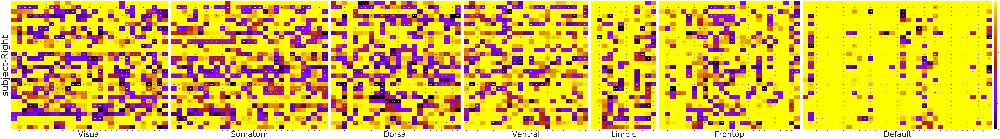

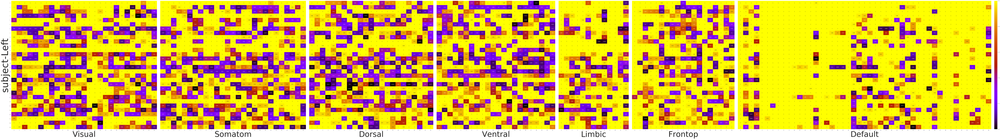

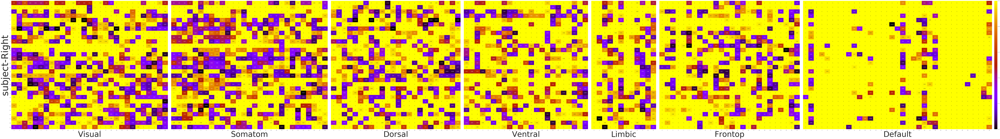

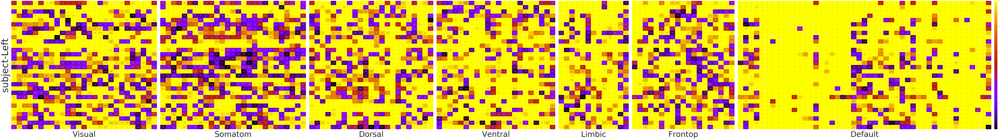

In [ ]:
# trt = ['test', 'retest']
# ses = ['rfMRI_REST1_LR', 'rfMRI_REST1_RL','rfMRI_REST2_LR','rfMRI_REST2_RL']
trt = ['test']
ses = ['rfMRI_REST1_LR', 'rfMRI_REST2_LR']
%matplotlib notebook
%matplotlib inline
sub_list_length = 30  # Ting31.list - exclude one subject

cmap = 'gnuplot' #'seismic','gnuplot','binary'
vmax = 1
vmin = 0

for trt_i, trt_id in enumerate(trt):
  for ses_j,ses_id in enumerate(ses):
    roi_R = [[]]*7
    roi_L = [[]]*7
    for k in range(7): 
      roi_R[k] = np.zeros((sub_list_length, np.count_nonzero(roi_labels_R == k+1)))
      roi_L[k] = np.zeros((sub_list_length, np.count_nonzero(roi_labels_L == k+1)))
      for i in range(sub_list_length):
        mask_R = np.where(roi_labels_R==k+1)
        mask_L = np.where(roi_labels_L==k+1)
        if trt_i == 0:
          data_roi_R = optimal_scale_X_append[ses_j][:,0:180]
          data_roi_L = optimal_scale_X_append[ses_j][:,180:360]
        if trt_i == 1:
          data_roi_R = optimal_scale_X_append[ses_j+len(ses)][:,0:180]
          data_roi_L = optimal_scale_X_append[ses_j+len(ses)][:,180:360]
        roi_R[k][i] = data_roi_R[i][mask_R]
        roi_L[k][i] = data_roi_L[i][mask_L]

    roi_label_name=['Visual','Somatom','Dorsal','Ventral','Limbic','Frontop', 'Default']

    sns.set(rc={'figure.figsize':(180,25)})  
    fig = plt.figure(constrained_layout=True)
    # fig.suptitle(trt_id+' '+ ses_id , fontsize=16)

    widths = []
    for k in range(7):
      widths = np.append(widths, roi_R[k].shape[1])

    heights = [sub_list_length]
    spec = fig.add_gridspec(ncols=7, nrows=1, width_ratios=widths, height_ratios=heights)

    # optimal scale
    for col in range(7):
        ax = fig.add_subplot(spec[0, col])
        if col in range(1,6):
          g = sns.heatmap(roi_R[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin,cbar=False)
          g.set(yticklabels=[])
        if col==0:
          g = sns.heatmap(roi_R[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin,cbar=False)
          ax.set_ylabel('subject-Right', fontsize = 120) #ax.set_ylabel('Subject', fontsize = 80) 
        if col == 6:
          g = sns.heatmap(roi_R[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin, cbar=True, cbar_kws={'aspect':300,'pad':0.01}) #pad=0.01, shrink=0.8, fraction=0.1
          g.set(yticklabels=[])
          # g.tick_params(labelsize=60)
        ax.set_xlabel(str(roi_label_name[col]), fontsize = 100) #fontsize = 80
    
    sns.set(rc={'figure.figsize':(180,25)})  
    fig = plt.figure(constrained_layout=True)
    widths = []
    for k in range(7):
      widths = np.append(widths, roi_L[k].shape[1])
    heights = [sub_list_length]
    spec = fig.add_gridspec(ncols=7, nrows=1, width_ratios=widths, height_ratios=heights)

    for col in range(7):
        ax = fig.add_subplot(spec[0, col])
        if col in range(1,6):
          g = sns.heatmap(roi_L[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin,cbar=False)
          g.set(yticklabels=[])
        if col==0:
          g = sns.heatmap(roi_L[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin,cbar=False)
          ax.set_ylabel('subject-Left', fontsize = 120) #ax.set_ylabel('Subject', fontsize = 80) 
        if col == 6:
          g = sns.heatmap(roi_L[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin, cbar=True, cbar_kws={'aspect':300,'pad':0.01}) #pad=0.01, shrink=0.8, fraction=0.1
          g.set(yticklabels=[])
          # g.tick_params(labelsize=60)
        ax.set_xlabel(str(roi_label_name[col]), fontsize = 100) #fontsize = 80

# colorbar

<Figure size 576x576 with 0 Axes>

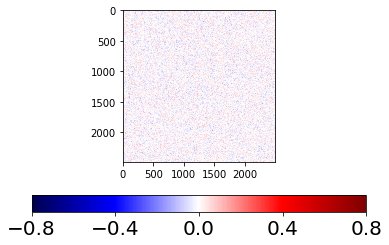

In [ ]:
from matplotlib.colors import Normalize, LinearSegmentedColormap, to_rgba
from matplotlib.cm import ScalarMappable, get_cmap
our_cmap = get_cmap('gnuplot_r')
tr=1200
threshold=1-(tr - np.sqrt(tr))/tr
norm = Normalize(vmin=0, vmax=1)
if threshold is not None:
    cmaplist = [our_cmap(i) for i in range(our_cmap.N)]
    # set colors to grey for absolute values < threshold
    istart = int(norm(-threshold, clip=True) *
                  (our_cmap.N - 1))
    istop = int(norm(threshold, clip=True) *
                (our_cmap.N - 1))
    for i in range(istart, istop):
        cmaplist[i] = (0.5, 0.5, 0.5, 1.)
    our_cmap = LinearSegmentedColormap.from_list(
        'Custom cmap', cmaplist, our_cmap.N)
                
import matplotlib.pyplot as plt
import numpy as np
from numpy.random import randn

data = np.clip(randn(2500, 2500), -0.8, 0.8)
plt.figure(figsize=(8,8))
fig, ax = plt.subplots()

# plt.subplot(211)

# plt.subplot(212)
cax = ax.imshow(data, cmap='seismic') #seismic our_cmap 'gnuplot', 'jet','RdBu_r, gist_heat_r

# ax.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
# cax = plt.axes([0.85, 0.1, 0.075, 0.8])
# # cb = plt.colorbar(cax=cax,ticks=[-0.8,0,0.8], shrink =0.1,fraction=0.1)
# # cb = plt.colorbar(cax=cax,ticks=[], shrink =0.1,fraction=0.1)

cbar = fig.colorbar(cax, ticks=[-0.8,-0.4,0,0.4,0.8],orientation='horizontal') #[-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1] 
# cbar.ax.set_xticklabels(['Global','Local'])  # horizontal colorbar
cbar.ax.set_yticklabels(['0','1'])  # horizontal colorbar
cbar.ax.tick_params(labelsize=20)
# plt.clim(-0.8, 0.8);
plt.show()

In [ ]:
a = np.arange(6,11)
a

array([ 6,  7,  8,  9, 10])

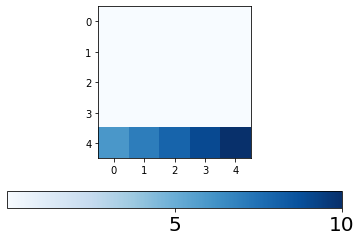

In [ ]:
# a = np.arange(51,101)
# data = np.append(np.zeros((49,50)),a).reshape(50,50)
a = np.arange(6,11)
data = np.append(np.zeros((5,6)),a).reshape(16,16)
fig, ax = plt.subplots()
cax = ax.imshow(data, cmap='seismic') #seismic our_cmap 'gnuplot', 'gist_heat_r'
cbar = fig.colorbar(cax, ticks=[5,10], orientation='horizontal')
cbar.ax.tick_params(labelsize=20)
plt.show()

optimal scale threshold - my map

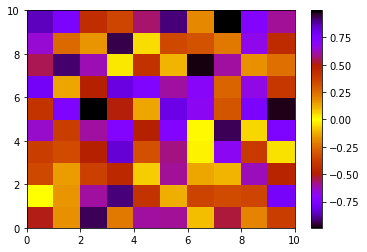

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
data = np.random.rand(10,10) * 2 - 1

# sample the colormaps that you want to use. Use 128 from each so we get 256
# colors in total
# colors1 = plt.cm.gist_heat(np.linspace(0., 1, 128))
# colors2 = plt.cm.gist_heat_r(np.linspace(0, 1, 128))
colors1 = plt.cm.gnuplot(np.linspace(0., 1, 128))
colors2 = plt.cm.gnuplot_r(np.linspace(0, 1, 128))

# combine them and build a new colormap
colors = np.vstack((colors1, colors2))
mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)

plt.pcolor(data, cmap=mymap)
plt.colorbar()
plt.show()

## plot on hemi

In [ ]:
from nilearn import surface
from nilearn import plotting
def parcel2vert(wdir,lsurf,plabel,theta_img):
    glasserlabel,(ax1,ax2) = cifti.read(plabel)
    numverts = int(glasserlabel.shape[1]/2)
    if len(theta_img.shape) >1:
        numparcels = len(theta_img)
    else:
        numparcels = 1
        theta_img = np.reshape(theta_img,[-1,len(theta_img)])
    nparc = np.arange(numparcels)
    data = np.zeros([numparcels,numverts])
    for parcel in nparc:
        for plabel in range(int(np.max((glasserlabel)/2))): #note: 32k hcp map weried, , so hardcode 180
            p_idx = np.where(glasserlabel[0,:]==plabel+1)
            data[parcel,p_idx] = theta_img[parcel,plabel]
    return data 
def parcel2vert_r(wdir,rsurf,plabel,theta_img):
    glasserlabel,(ax1,ax2) = cifti.read(plabel)
    numverts = int(glasserlabel.shape[1]/2)
    if len(theta_img.shape) >1:
        numparcels = len(theta_img)
    else:
        numparcels = 1
        theta_img = np.reshape(theta_img,[-1,len(theta_img)])
    nparc = np.arange(numparcels)
    data = np.zeros([numparcels,numverts])
    for parcel in nparc:
        for plabel in range(int(np.max((glasserlabel)/2)), int(np.max((glasserlabel)))):
            p_idx = np.where(glasserlabel[0,:]==plabel+1)
            j = int(glasserlabel.shape[1]/2)
            p_idx_new = tuple(map(lambda i: i-j, p_idx))
            plabel = plabel-180
            data[parcel,p_idx_new] = theta_img[parcel,plabel]
    return data 

### homo

In [ ]:
optimal_scale_diff.shape

(30, 180)

In [ ]:
optimal_scale_X_all.shape

(60, 180)

all linear/ all nonlinear across session 1 and 2

In [ ]:
# all linear/ all nonlinear across session 1 and 2
all_linear_nogsr = optimal_scale_X_nonlinear_binary_append_nogsr[0]+optimal_scale_X_nonlinear_binary_append_nogsr[1]

# note: 0 is the parcel both sessions are linear
# 1 is the parcel one session is linear, the other session is nonlinear
# 2 is the parcel both sessions are nonlinear

old_val = np.array([0,1,2])
new_val = np.array([1,0,0])
a = all_linear_nogsr
i = np.searchsorted(old_val,a)
both_linear_replaced_nogsr = new_val[i]

old_val = np.array([0,1,2])
new_val = np.array([0,1,0])
a = all_linear_nogsr
i = np.searchsorted(old_val,a)
diff_replaced_nogsr = new_val[i]

old_val = np.array([0,1,2])
new_val = np.array([0,0,1])
a = all_linear_nogsr
i = np.searchsorted(old_val,a)
both_nonlinear_replaced_nogsr = new_val[i]


<Figure size 1440x1440 with 0 Axes>

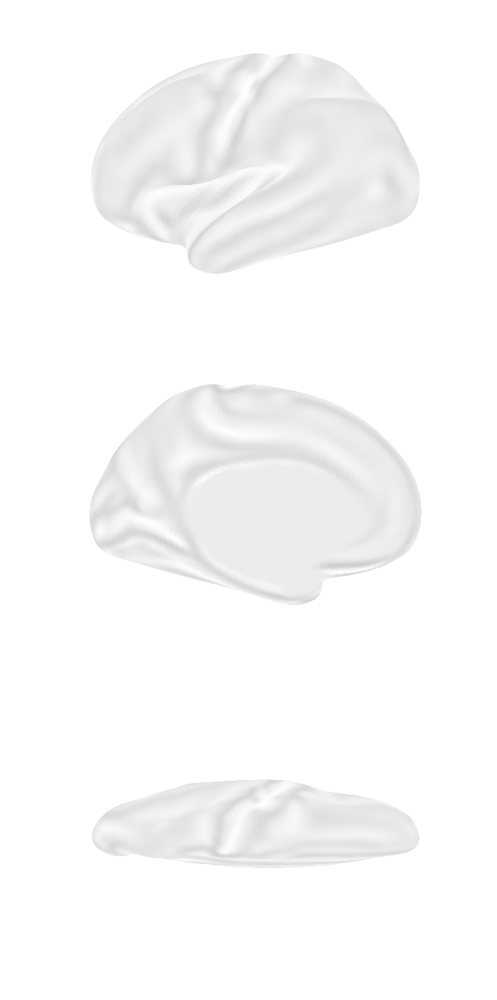

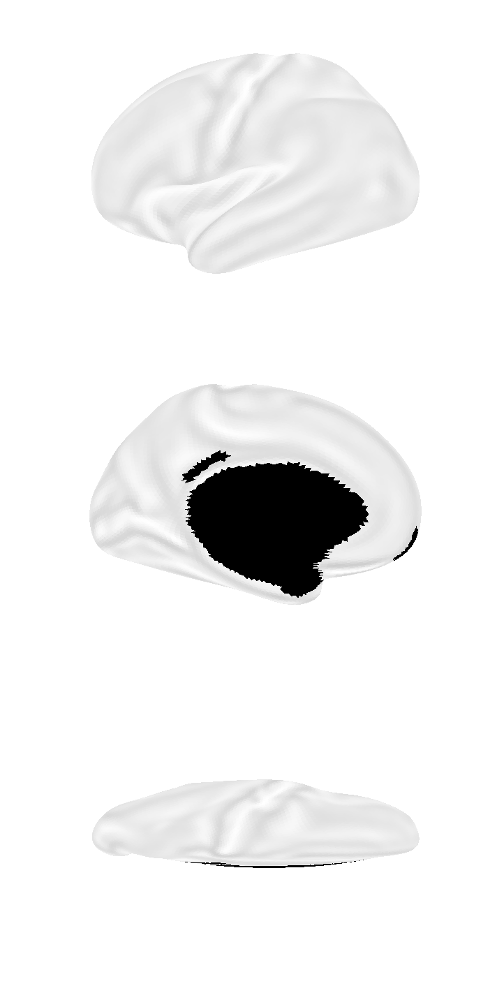

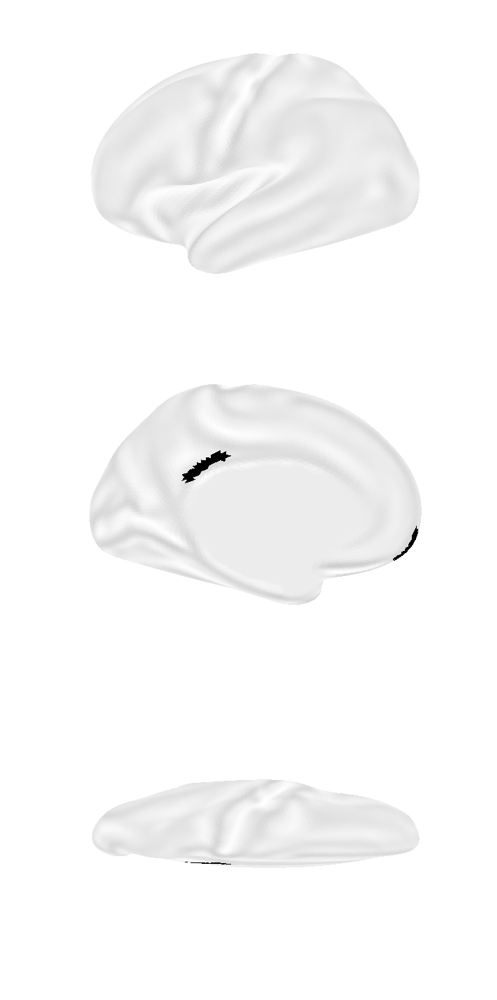

"\n\nsurf_map = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.R.very_inflated.10k_fs_LR.surf.gii'\nbg_map = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/S1200.L.curvature_MSMAll.10k_fs_LR.func.gii'\n\nplt.figure(figsize=(20,20))\nthreshold = 1-(tr - np.sqrt(tr))/tr\nj=1\nfor v in views:\n    ax = plt.subplot(3,2,2*j-1, projection='3d')\n    plotting.plot_surf_stat_map(leftsurface, stat_map=1-img_optimal_scale_X_mean,\n                                hemi='left', view=v, colorbar=False,\n                                bg_map=bg_map, bg_on_data=True,cmap=mymap,darkness = 0.3,\n                                threshold=threshold,axes=ax)\n    ax = plt.subplot(3,2,2*j, projection='3d')\n    plotting.plot_surf_stat_map(rightsurface, stat_map=1-img_optimal_scale_X_mean_r,\n                            hemi='right', view=v, colorbar=False,\n                            bg_map=bg_map, bg_on_data=True,cmap=mymap,darkness = 0.3,\n                            threshold=threshold,axes=ax)\n    

In [ ]:
%matplotlib inline
wdir = '/gdrive/My Drive/CMI/Project/MGCX/data'
parcel_label = plabel = '%s/HCP_MMP_P210_10k.dlabel.nii' % wdir
rightsurface = rsurf='/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.R.very_inflated.10k_fs_LR.surf.gii'
leftsurface = lsurf = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.L.very_inflated.10k_fs_LR.surf.gii'
# '/gdrive/My Drive/CMI/Project/MGCX/data/fsaverage5.L.midthickness.surf.gii'

# optimal_scale_X_mean = np.mean(diff_replaced_nogsr,axis=0)
optimal_scale_X_mean = np.mean(both_nonlinear_replaced_nogsr,axis=0)
img_optimal_scale_X_mean = parcel2vert(wdir,lsurf,parcel_label,optimal_scale_X_mean.reshape(1,180))
img_optimal_scale_X_mean_r = parcel2vert_r(wdir,rsurf,parcel_label,optimal_scale_X_mean.reshape(1,180))

cmap = 'gist_heat_r' #'seismic', 'gnuplot', 'binary','jet','gist_heat_r','gist_heat'
vmax = 1
vmin = 0
j=1
plt.figure(figsize=(20,20))
views = ['lateral', 'medial', 'dorsal']
bg_map = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/S1200.L.curvature_MSMAll.10k_fs_LR.func.gii'


# 30 subjects for nonlinear/linear/diff

for i in range(1,2):
  img_optimal_scale_X_mean_nonlinear = parcel2vert(wdir,lsurf,parcel_label,both_nonlinear_replaced_nogsr[i].reshape(1,180))
  img_optimal_scale_X_mean_linear = parcel2vert(wdir,lsurf,parcel_label,both_linear_replaced_nogsr[i].reshape(1,180))
  img_optimal_scale_X_mean_diff = parcel2vert(wdir,lsurf,parcel_label,diff_replaced_nogsr[i].reshape(1,180))
  plt.figure(figsize=(10,20))
  j=1
  for v in views:
      ax = plt.subplot(3,1,1*j, projection='3d') #bg_on_data=False, when plot pearson, R, optimal scale, True, when plot threshold, nonlinear
      plotting.plot_surf(leftsurface, img_optimal_scale_X_mean_nonlinear, bg_map=bg_map, bg_on_data=True,hemi='left',view = v, cmap = 'gist_heat_r', colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 0.2, symmetric_cmap=False,axes=ax)
      
      j+=1
  plt.tight_layout()
  plt.show()
  plt.figure(figsize=(10,20))
  j=1
  for v in views:
      ax = plt.subplot(3,1,1*j, projection='3d') #bg_on_data=False, when plot pearson, R, optimal scale, True, when plot threshold, nonlinear
      plotting.plot_surf(leftsurface, img_optimal_scale_X_mean_linear, bg_map=bg_map, bg_on_data=True,hemi='left',view = v, cmap = 'gist_heat', colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 0.2, symmetric_cmap=False,axes=ax)
      
      j+=1

  plt.tight_layout()
  plt.show()
  plt.figure(figsize=(10,20))
  j=1
  for v in views:
      ax = plt.subplot(3,1,1*j, projection='3d') #bg_on_data=False, when plot pearson, R, optimal scale, True, when plot threshold, nonlinear
      plotting.plot_surf(leftsurface, img_optimal_scale_X_mean_diff, bg_map=bg_map, bg_on_data=True,hemi='left',view = v, cmap = 'gist_heat_r', colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 0.2, symmetric_cmap=False,axes=ax)
      
      j+=1

  plt.tight_layout()
  plt.show()


# for v in views:
#     ax = plt.subplot(3,2,2*j-1, projection='3d') #bg_on_data=False, when plot pearson, R, optimal scale, True, when plot threshold, nonlinear
#     plotting.plot_surf(leftsurface, img_optimal_scale_X_mean, bg_map=bg_map, bg_on_data=True,hemi='left',view = v, cmap = cmap, colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 0.2, symmetric_cmap=False,axes=ax)
    
#     ax = plt.subplot(3,2,2*j, projection='3d')
#     plotting.plot_surf(rightsurface, img_optimal_scale_X_mean_r, bg_map=bg_map, bg_on_data=True, hemi='right',view = v, cmap = cmap, colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 0.2, symmetric_cmap=False,axes=ax)
    
#     j+=1

# plt.tight_layout()
# plt.show()


'''

surf_map = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.R.very_inflated.10k_fs_LR.surf.gii'
bg_map = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/S1200.L.curvature_MSMAll.10k_fs_LR.func.gii'

plt.figure(figsize=(20,20))
threshold = 1-(tr - np.sqrt(tr))/tr
j=1
for v in views:
    ax = plt.subplot(3,2,2*j-1, projection='3d')
    plotting.plot_surf_stat_map(leftsurface, stat_map=1-img_optimal_scale_X_mean,
                                hemi='left', view=v, colorbar=False,
                                bg_map=bg_map, bg_on_data=True,cmap=mymap,darkness = 0.3,
                                threshold=threshold,axes=ax)
    ax = plt.subplot(3,2,2*j, projection='3d')
    plotting.plot_surf_stat_map(rightsurface, stat_map=1-img_optimal_scale_X_mean_r,
                            hemi='right', view=v, colorbar=False,
                            bg_map=bg_map, bg_on_data=True,cmap=mymap,darkness = 0.3,
                            threshold=threshold,axes=ax)
    j+=1

plt.tight_layout()
plt.show()
'''



### dmn

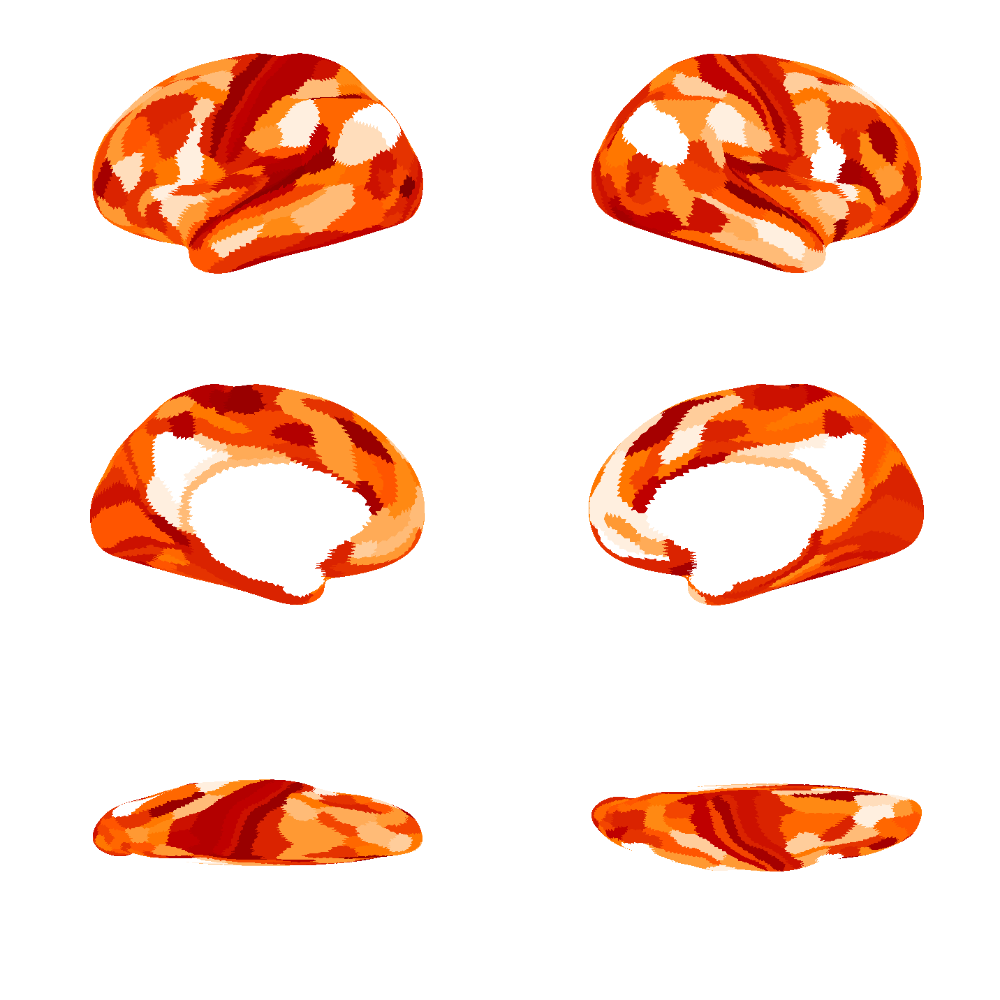

In [ ]:
%matplotlib inline
wdir = '/gdrive/My Drive/CMI/Project/MGCX/data'
parcel_label = plabel = '%s/HCP_MMP_P210_10k.dlabel.nii' % wdir
rightsurface = rsurf='/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.R.very_inflated.10k_fs_LR.surf.gii'
leftsurface = lsurf = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.L.very_inflated.10k_fs_LR.surf.gii'
# '/gdrive/My Drive/CMI/Project/MGCX/data/fsaverage5.L.midthickness.surf.gii'

optimal_scale_X_mean = np.mean(optimal_scale_diff,axis=0)
img_optimal_scale_X_mean = parcel2vert(wdir,lsurf,parcel_label,optimal_scale_X_mean[180:360].reshape(1,180))
img_optimal_scale_X_mean_r = parcel2vert_r(wdir,rsurf,parcel_label,optimal_scale_X_mean[0:180].reshape(1,180))

cmap = 'gist_heat_r' #'seismic', 'gnuplot', gist_heat_r, 'binary','bone_r'
vmax = 1
vmin = 0
j=1
plt.figure(figsize=(20,20))
views = ['lateral', 'medial', 'dorsal']
bg_map = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/S1200.L.curvature_MSMAll.10k_fs_LR.func.gii'

for v in views:
    ax = plt.subplot(3,2,2*j-1, projection='3d')
    plotting.plot_surf(leftsurface, img_optimal_scale_X_mean, bg_map=bg_map, hemi='left',view = v, cmap = cmap, colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
    
    ax = plt.subplot(3,2,2*j, projection='3d')
    plotting.plot_surf(rightsurface, img_optimal_scale_X_mean_r, bg_map=bg_map, hemi='right',view = v, cmap = cmap, colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
    
    j+=1

plt.tight_layout()
plt.show()


# surf_map = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.R.very_inflated.10k_fs_LR.surf.gii'
# bg_map = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/S1200.L.curvature_MSMAll.10k_fs_LR.func.gii'

# plt.figure(figsize=(20,20))
# threshold = 1-(tr - np.sqrt(tr))/tr
# j=1
# for v in views:
#     ax = plt.subplot(3,2,2*j-1, projection='3d')
#     plotting.plot_surf_stat_map(leftsurface, stat_map=1-img_optimal_scale_X_mean,
#                                 hemi='left', view=v, colorbar=False,
#                                 bg_map=bg_map, bg_on_data=True,cmap='gist_heat',darkness = 0.4,
#                                 threshold=threshold,axes=ax)
#     ax = plt.subplot(3,2,2*j, projection='3d')
#     plotting.plot_surf_stat_map(rightsurface, stat_map=1-img_optimal_scale_X_mean_r,
#                             hemi='right', view=v, colorbar=False,
#                             bg_map=bg_map, bg_on_data=True,cmap='gist_heat',darkness = 0.4,
#                             threshold=threshold,axes=ax)
#     j+=1

# plt.tight_layout()
# plt.show()




### subcortical

In [ ]:
def plot_fast(subcortical_id, data,cmap,vmax,vmin):
  j=1
  plt.figure(figsize=(20,20))
  views = ['lateral', 'medial', 'dorsal']
  bg_map = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/S1200.L.curvature_MSMAll.10k_fs_LR.func.gii'

  optimal_scale_X_mean = np.mean(data[subcortical_id],axis=0)
  img_optimal_scale_X_mean = parcel2vert(wdir,lsurf,parcel_label,optimal_scale_X_mean[180:360].reshape(1,180))
  img_optimal_scale_X_mean_r = parcel2vert_r(wdir,rsurf,parcel_label,optimal_scale_X_mean[0:180].reshape(1,180))
  
  views = ['lateral', 'medial', 'dorsal']
  for v in views:
      ax = plt.subplot(3,2,2*j-1, projection='3d')
      plotting.plot_surf(leftsurface, img_optimal_scale_X_mean, bg_map=bg_map, hemi='left',view = v, cmap = cmap, colorbar = True, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
      
      ax = plt.subplot(3,2,2*j, projection='3d')
      plotting.plot_surf(rightsurface, img_optimal_scale_X_mean_r, bg_map=bg_map, hemi='right',view = v, cmap = cmap, colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
      
      j+=1

  plt.tight_layout()
  plt.show()

(array([ 0.,  5., 10., 15., 20., 25., 30.]),
 <a list of 7 Text major ticklabel objects>)

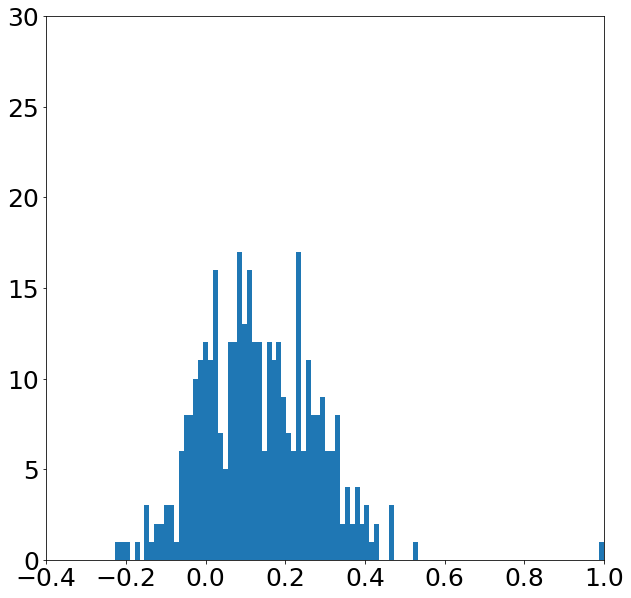

In [ ]:
k = np.sort(pearson_corr_by_parcel[13])
plt.figure(figsize=(10,10))
plt.hist(k[0], bins = 100)
plt.xlim(-0.4,1)
plt.ylim(0,30)
plt.xticks(size = 25)
plt.yticks(size = 25)

(array([ 0.,  5., 10., 15., 20., 25., 30.]),
 <a list of 7 Text major ticklabel objects>)

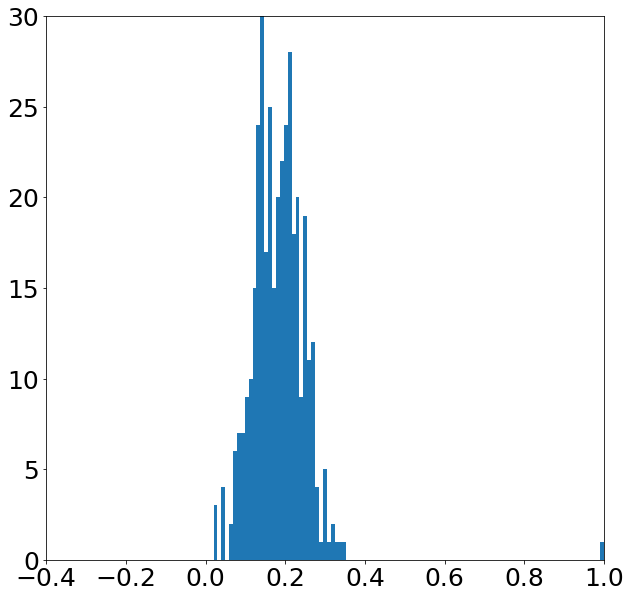

In [ ]:
k = np.sort(pearson_corr_by_parcel[6])
plt.figure(figsize=(10,10))
plt.hist(k[0], bins = 100)
plt.xlim(-0.4,1)
plt.ylim(0,30)
plt.xticks(size = 25)
plt.yticks(size = 25)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


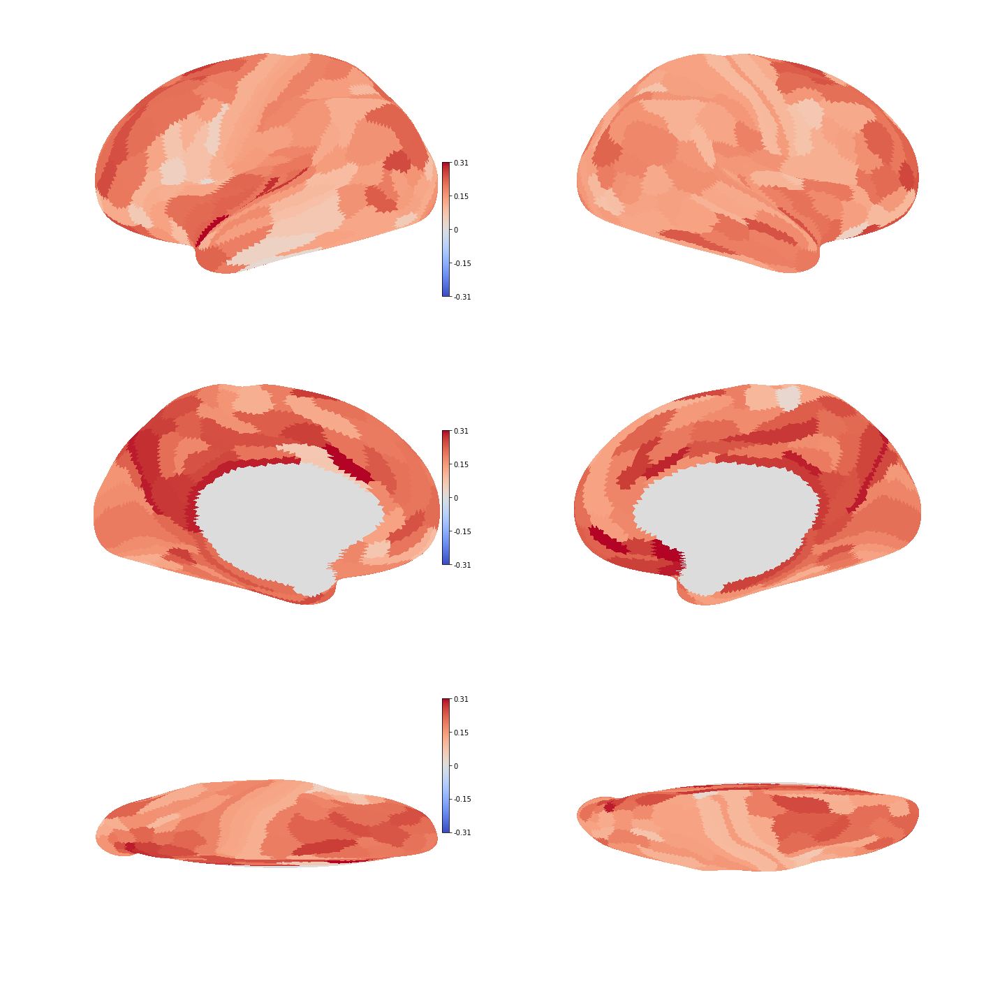

"\n# Optimal Scale (X) Nonlinear # of 6 subjects\noptimal_scale_X_mean = np.sum(optimal_scale_X_nonlinear_binary_by_parcel[subcortical_id],axis=0)\nimg_optimal_scale_X_mean = parcel2vert(wdir,lsurf,parcel_label,optimal_scale_X_mean[180:360].reshape(1,180))\nimg_optimal_scale_X_mean_r = parcel2vert_r(wdir,rsurf,parcel_label,optimal_scale_X_mean[0:180].reshape(1,180))\n\nplt.figure(figsize=(20,20))\nvmax=len(sub_id)\nvmin=0\n\nj=1\nfor v in views:\n    ax = plt.subplot(3,2,2*j-1, projection='3d')\n    plotting.plot_surf(leftsurface, img_optimal_scale_X_mean, bg_map=bg_map, hemi='left',view = v, cmap = 'Greys', colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)\n    \n    ax = plt.subplot(3,2,2*j, projection='3d')\n    plotting.plot_surf(rightsurface, img_optimal_scale_X_mean_r, bg_map=bg_map, hemi='right',view = v, cmap = 'Greys', colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness =

In [ ]:
%matplotlib inline
wdir = '/gdrive/My Drive/CMI/Project/MGCX/data'
parcel_label = plabel = '%s/HCP_MMP_P210_10k.dlabel.nii' % wdir
rightsurface = rsurf='/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.R.very_inflated.10k_fs_LR.surf.gii'
leftsurface = lsurf = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.L.very_inflated.10k_fs_LR.surf.gii'

# cmap = 'gnuplot' #'seismic', 'gnuplot', gist_heat_r, 'binary','bone_r'


subcortical_id = 6

# data = pearson_corr_by_parcel
# plot_fast(subcortical_id,data,'seismic',1,-1)
 
# hcp retest_nogsr_103818_rfMRI_REST1_LR subcortical-to-cortical corr is too high. compare with dynn in wb_view to make sure my plot is correct
data = pearson_corr_by_parcel
plot_fast(subcortical_id,data,'coolwarm',0.31,-0.31) #hot

# data = test_statistic_by_parcel
# plot_fast(subcortical_id,data,'seismic',1,-1)


# data = optimal_scale_X_by_parcel
# plot_fast(subcortical_id,data,'gnuplot',1,0)
'''
# Optimal Scale (X) threshold
data = optimal_scale_X_by_parcel
optimal_scale_X_mean = np.mean(data[subcortical_id],axis=0)
img_optimal_scale_X_mean = parcel2vert(wdir,lsurf,parcel_label,optimal_scale_X_mean[180:360].reshape(1,180))
img_optimal_scale_X_mean_r = parcel2vert_r(wdir,rsurf,parcel_label,optimal_scale_X_mean[0:180].reshape(1,180))

plt.figure(figsize=(20,20))
threshold = 1-(tr - np.sqrt(tr))/tr
j=1
views = ['lateral', 'medial', 'dorsal']
bg_map = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/S1200.L.curvature_MSMAll.10k_fs_LR.func.gii'
for v in views:
    ax = plt.subplot(3,2,2*j-1, projection='3d')
    plotting.plot_surf_stat_map(leftsurface, stat_map=1-img_optimal_scale_X_mean,
                                hemi='left', view=v, colorbar=False,
                                bg_map=bg_map, bg_on_data=True,cmap='gist_heat',darkness = 0.4,
                                threshold=threshold,axes=ax)
    ax = plt.subplot(3,2,2*j, projection='3d')
    plotting.plot_surf_stat_map(rightsurface, stat_map=1-img_optimal_scale_X_mean_r,
                            hemi='right', view=v, colorbar=False,
                            bg_map=bg_map, bg_on_data=True,cmap='gist_heat',darkness = 0.4,
                            threshold=threshold,axes=ax)
    j+=1

plt.tight_layout()
plt.show()
'''
'''
# Optimal Scale (X) Nonlinear # of 6 subjects
optimal_scale_X_mean = np.sum(optimal_scale_X_nonlinear_binary_by_parcel[subcortical_id],axis=0)
img_optimal_scale_X_mean = parcel2vert(wdir,lsurf,parcel_label,optimal_scale_X_mean[180:360].reshape(1,180))
img_optimal_scale_X_mean_r = parcel2vert_r(wdir,rsurf,parcel_label,optimal_scale_X_mean[0:180].reshape(1,180))

plt.figure(figsize=(20,20))
vmax=len(sub_id)
vmin=0

j=1
for v in views:
    ax = plt.subplot(3,2,2*j-1, projection='3d')
    plotting.plot_surf(leftsurface, img_optimal_scale_X_mean, bg_map=bg_map, hemi='left',view = v, cmap = 'Greys', colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
    
    ax = plt.subplot(3,2,2*j, projection='3d')
    plotting.plot_surf(rightsurface, img_optimal_scale_X_mean_r, bg_map=bg_map, hemi='right',view = v, cmap = 'Greys', colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
    
    j+=1

plt.tight_layout()
plt.show()
'''


# ICC

## ICC function

In [ ]:

import os
import numpy as np
from numpy import ones, kron, mean, eye, hstack, dot, tile
from numpy.linalg import pinv
import nibabel as nb

# https://github.com/nipy/nipype/blob/8946bcab9d0e2f24e5364e42d4a7766e00237cb8/nipype/algorithms/icc.py#L80
def ICC_rep_anova(Y):
    """
    the data Y are entered as a 'table' ie subjects are in rows and repeated
    measures in columns
    One Sample Repeated measure ANOVA
    Y = XB + E with X = [FaTor / Subjects]
    """

    [nb_subjects, nb_conditions] = Y.shape
    dfc = nb_conditions - 1
    dfe = (nb_subjects - 1) * dfc
    dfr = nb_subjects - 1

    # Compute the repeated measure effect
    # ------------------------------------

    # Sum Square Total
    mean_Y = mean(Y)
    SST = ((Y - mean_Y) ** 2).sum()

    # create the design matrix for the different levels
    x = kron(eye(nb_conditions), ones((nb_subjects, 1)))  # sessions
    x0 = tile(eye(nb_subjects), (nb_conditions, 1))  # subjects
    X = hstack([x, x0])

    # Sum Square Error
    predicted_Y = dot(dot(dot(X, pinv(dot(X.T, X))), X.T), Y.flatten("F"))
    residuals = Y.flatten("F") - predicted_Y
    SSE = (residuals ** 2).sum()

    residuals.shape = Y.shape

    MSE = SSE / dfe

    # Sum square session effect - between colums/sessions
    SSC = ((mean(Y, 0) - mean_Y) ** 2).sum() * nb_subjects
    MSC = SSC / dfc / nb_subjects

    session_effect_F = MSC / MSE

    # Sum Square subject effect - between rows/subjects
    SSR = SST - SSC - SSE
    MSR = SSR / dfr

    # ICC(3,1) = (mean square subjeT - mean square error) /
    #            (mean square subjeT + (k-1)*-mean square error)
    ICC = (MSR - MSE) / (MSR + dfc * MSE)

    e_var = MSE  # variance of error
    r_var = (MSR - MSE) / nb_conditions  # variance between subjects

    return ICC, r_var, e_var, session_effect_F, dfc, dfe

## calculate icc

In [ ]:
icc_input.shape
# subjects are in rows and repeated
    # measures in columns

(30, 2)

In [ ]:
len(pearson_corr_append)

2

In [ ]:
ICC_all = []
icc_data = pearson_corr_append
for i in range(p):
  each_run = []
  for j in range(len(pearson_corr_append)):
    each_run.append(icc_data[j][:,i])
  icc_input = np.vstack(each_run).T
  ICC, r_var, e_var, session_effect_F, dfc, dfe = ICC_rep_anova(icc_input)
  ICC_all.append(ICC)

ICC_all = np.vstack(ICC_all)

In [ ]:
np.max(ICC_all)

0.8515903176629197

In [ ]:
np.min(ICC_all)

-204.955555555554

## plot icc

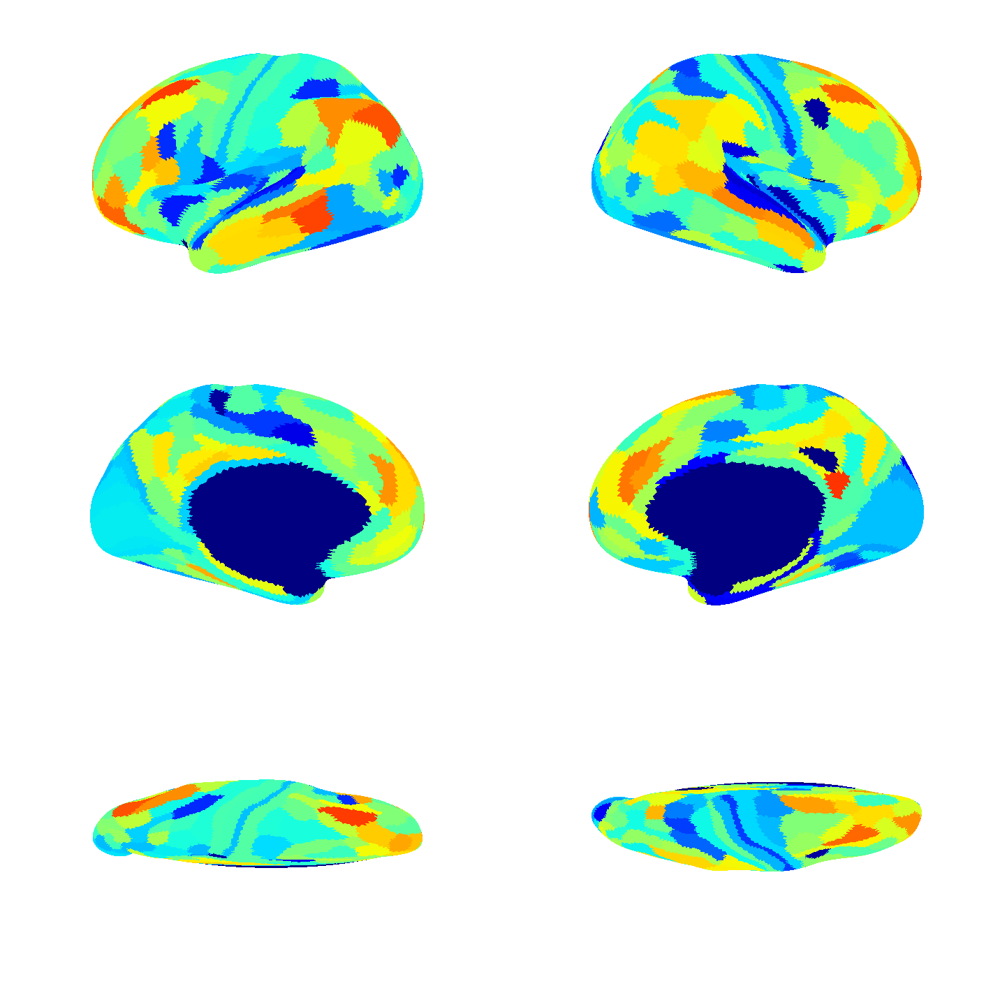

In [ ]:
%matplotlib inline
wdir = '/gdrive/My Drive/CMI/Project/MGCX/data'
parcel_label = plabel = '%s/HCP_MMP_P210_10k.dlabel.nii' % wdir
rightsurface = rsurf='/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.R.very_inflated.10k_fs_LR.surf.gii'
leftsurface = lsurf = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.L.very_inflated.10k_fs_LR.surf.gii'
# '/gdrive/My Drive/CMI/Project/MGCX/data/fsaverage5.L.midthickness.surf.gii'

# homo
# img_ICC = parcel2vert(wdir,lsurf,parcel_label,ICC_all.reshape(1,180))
# img_ICC_r = parcel2vert_r(wdir,rsurf,parcel_label,ICC_all.reshape(1,180))

# dmn
img_ICC = parcel2vert(wdir,lsurf,parcel_label,ICC_all[180:360].reshape(1,180))
img_ICC_r = parcel2vert_r(wdir,rsurf,parcel_label,ICC_all[0:180].reshape(1,180))

cmap = 'jet' #'seismic', 'gnuplot'
vmax = 1
vmin = 0
j=1
plt.figure(figsize=(20,20))
views = ['lateral', 'medial', 'dorsal']
for v in views:
    ax = plt.subplot(3,2,2*j-1, projection='3d')
    plotting.plot_surf(leftsurface, img_ICC, bg_map=None, hemi='left',view = v, cmap = cmap, colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
    
    ax = plt.subplot(3,2,2*j, projection='3d')
    plotting.plot_surf(rightsurface, img_ICC_r, bg_map=None, hemi='right',view = v, cmap = cmap, colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
    
    j+=1

plt.tight_layout()
plt.show()

# Discriminability

## Discirminability function

In [ ]:
!pip install oct2py

In [ ]:
from oct2py import octave
from oct2py import Oct2Py
oc = Oct2Py()
y = oc.eval("[1:10 1:10];")
y

array([[ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.,  1.,  2.,  3.,
         4.,  5.,  6.,  7.,  8.,  9., 10.]])

In [ ]:
pearson_corr_all.shape

(60, 360)

In [ ]:
# calculate whole-brain discriminability
from hyppo.discrim import DiscrimOneSample
sub_len=int(len(pearson_corr_all)/2)
sub=np.concatenate([np.arange(sub_len), np.arange(sub_len)], axis=0)
pearson_corr_stat,pearson_corr_pvalue = DiscrimOneSample().test(pearson_corr_all, sub)
test_statistic_stat,test_statistic_pvalue = DiscrimOneSample().test(test_statistic_all, sub)
optimal_scale_X_stat,optimal_scale_X_pvalue = DiscrimOneSample().test(optimal_scale_X_all, sub)

In [ ]:
print(pearson_corr_stat,test_statistic_stat,optimal_scale_X_stat)

0.8724137931034482 0.9097701149425287 0.6704022988505748


In [ ]:
# discriminability - per parcel
from hyppo.discrim import DiscrimOneSample
sub_len=int(len(pearson_corr_all)/2)
sub = np.concatenate([np.arange(sub_len), np.arange(sub_len)], axis=0)
DIS_all = []

# dis_data = pearson_corr_all
# dis_data = optimal_scale_X_all
dis_data = test_statistic_all
for i in range(p):
  discri_input = dis_data[:,i]
  stat, pvalue = DiscrimOneSample().test(discri_input.reshape(sub_len*2,1), sub)
  DIS_all.append(stat)

DIS_all = np.vstack(DIS_all)

### plot discriminability

In [ ]:
DIS_all.shape

(360, 1)

In [ ]:
np.max(DIS_all)

0.7951149425287356

In [ ]:
np.min(DIS_all)


0.4186781609195402

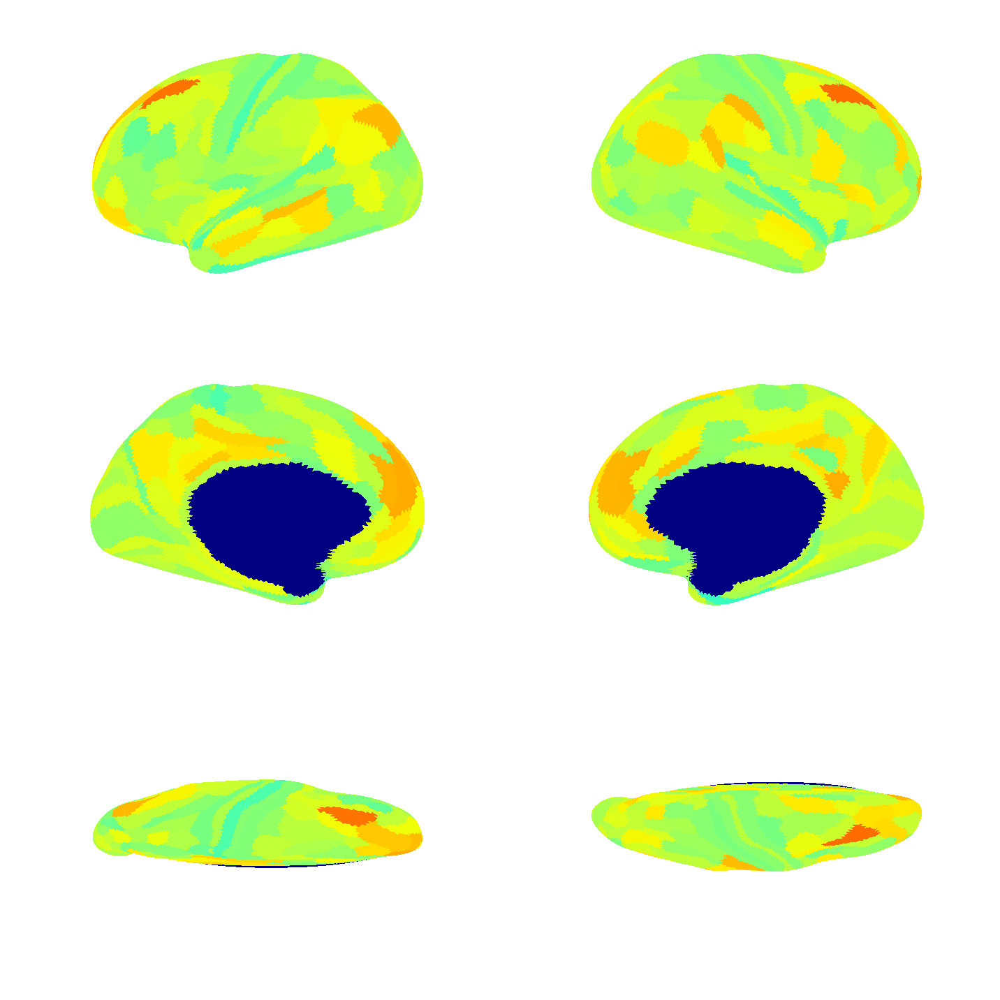

In [ ]:
%matplotlib inline
wdir = '/gdrive/My Drive/CMI/Project/MGCX/data'
parcel_label = plabel = '%s/HCP_MMP_P210_10k.dlabel.nii' % wdir
rightsurface = rsurf='/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.R.very_inflated.10k_fs_LR.surf.gii'
leftsurface = lsurf = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.L.very_inflated.10k_fs_LR.surf.gii'
# '/gdrive/My Drive/CMI/Project/MGCX/data/fsaverage5.L.midthickness.surf.gii'

# homo
# img_ICC = parcel2vert(wdir,lsurf,parcel_label,DIS_all.reshape(1,180))
# img_ICC_r = parcel2vert_r(wdir,rsurf,parcel_label,DIS_all.reshape(1,180))

# # dmn
img_ICC = parcel2vert(wdir,lsurf,parcel_label,DIS_all[180:360].reshape(1,180))
img_ICC_r = parcel2vert_r(wdir,rsurf,parcel_label,DIS_all[0:180].reshape(1,180))

cmap = 'jet' #'seismic', 'gnuplot'
vmax = 1
vmin = 0
j=1
plt.figure(figsize=(20,20))
views = ['lateral', 'medial', 'dorsal']
for v in views:
    ax = plt.subplot(3,2,2*j-1, projection='3d')
    plotting.plot_surf(leftsurface, img_ICC, bg_map=None, hemi='left',view = v, cmap = cmap, colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
    
    ax = plt.subplot(3,2,2*j, projection='3d')
    plotting.plot_surf(rightsurface, img_ICC_r, bg_map=None, hemi='right',view = v, cmap = cmap, colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
    
    j+=1

plt.tight_layout()
plt.show()

### R code -notused


In [ ]:
# activate R magic
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [ ]:
%%R
install.packages("mgc")
install.packages("reshape2")
install.packages("ggplot2")

In [ ]:
# https://cran.r-project.org/web/packages/mgc/vignettes/Discriminability.html
%%R
library(mgc)
library(reshape2)
library(ggplot2)

nsrc <- 5
nobs <- 10
d <- 20
set.seed(12345)
src_id <- array(1:nsrc)
Y <- sample(rep(src_id, nobs))
X <- t(sapply(Y, function(lab) rnorm(2, mean=lab, sd=1/2)))

Dx <- as.matrix(dist(X[sort(Y, index=TRUE)$ix,]), method='euclidian')
# plot_mtx(Dx)

discr.stat(Dx, sort(Y), is.dist=TRUE)$discr


[1] 0.9005


In [ ]:
%R -i Dx
%R -i Y


In [ ]:
%%R
discr.stat(Dx, Y, is.dist=TRUE)$discr

R[write to console]: Error in discr.validator(X, Y, is.dist = is.dist, dist.xfm = dist.xfm,  : 
  You have passed a vector containing only a single unique sample id.
Calls: <Anonymous> ... <Anonymous> -> withVisible -> discr.stat -> discr.validator




Error in discr.validator(X, Y, is.dist = is.dist, dist.xfm = dist.xfm,  : 
  You have passed a vector containing only a single unique sample id.
Calls: <Anonymous> ... <Anonymous> -> withVisible -> discr.stat -> discr.validator


In [ ]:
Y.shape
Dx.shape

(30, 30)

In [ ]:
%%R
library(datasets)
discr.stat(iris[,c(1,2,3,4)], as.vector(iris$Species))$discr

[1] 0.9320476


### compute_mnr.m -notused


In [ ]:
!apt install octave

In [ ]:
%%writefile compute_mnr.m
# https://github.com/neurodata/discriminability/blob/master/Code/MATLAB/Functions/compute_mnr.m 
% The function computes mnr for data 
% D should be an n*n matrix recording pairwise distance
% ID should be a vector of length n representing subject id
% of each row of D 
% The output are MNR of data set, standard error of MNR estimate
% and all MNRs for each pair of observations.
% Usage:
% MNR=compute_mnr(D,ID)
%[MNR, stdMNR] = compute_mnr(D,ID)
% [MNR, stdMNR, MNRs] = compute_mnr(D,ID)
function [ MNR, stdMNR, MNRs ] = compute_mnr(D,ID)
n=length(ID);
ranks=0;
rankij=[];
count=0;
if nargout>1
    MNRs=[];
end
for i=1:n    
    ind=find(ID==ID(i));
    s=length(ind);
    for j=ind
    di=D(i,:);
    d=D(i,j);
    di(ind)=Inf;
    if i~=j
        r=1-(sum(di<d) + 0.5*sum(di==d))/(n-s);
        ranks=r+ranks;
        count=count+1;
        rankij(count)=r;
        if nargout>1
            MNRs=[MNRs r];
        end
    end
    end   
end
MNR=ranks/count;
if nargout>1
    stdMNR=sqrt(var(rankij)/count);
end

end



Writing compute_mnr.m


In [ ]:
!octave -W compute_mnr.m

error: 'ID' undefined near line 13 column 10
error: called from
    compute_mnr at line 13 column 2


# spearman corr

## homo

[Text(0.5, 0, 'sub-1  ses-1'),
 Text(1.5, 0, 'sub-1  ses-2'),
 Text(2.5, 0, 'sub-2  ses-1'),
 Text(3.5, 0, 'sub-2  ses-2'),
 Text(4.5, 0, 'sub-3  ses-1'),
 Text(5.5, 0, 'sub-3  ses-2'),
 Text(6.5, 0, 'sub-4  ses-1'),
 Text(7.5, 0, 'sub-4  ses-2'),
 Text(8.5, 0, 'sub-5  ses-1'),
 Text(9.5, 0, 'sub-5  ses-2'),
 Text(10.5, 0, 'sub-6  ses-1'),
 Text(11.5, 0, 'sub-6  ses-2'),
 Text(12.5, 0, 'sub-7  ses-1'),
 Text(13.5, 0, 'sub-7  ses-2'),
 Text(14.5, 0, 'sub-8  ses-1'),
 Text(15.5, 0, 'sub-8  ses-2'),
 Text(16.5, 0, 'sub-9  ses-1'),
 Text(17.5, 0, 'sub-9  ses-2'),
 Text(18.5, 0, 'sub-10  ses-1'),
 Text(19.5, 0, 'sub-10  ses-2'),
 Text(20.5, 0, 'sub-11  ses-1'),
 Text(21.5, 0, 'sub-11  ses-2'),
 Text(22.5, 0, 'sub-12  ses-1'),
 Text(23.5, 0, 'sub-12  ses-2'),
 Text(24.5, 0, 'sub-13  ses-1'),
 Text(25.5, 0, 'sub-13  ses-2'),
 Text(26.5, 0, 'sub-14  ses-1'),
 Text(27.5, 0, 'sub-14  ses-2'),
 Text(28.5, 0, 'sub-15  ses-1'),
 Text(29.5, 0, 'sub-15  ses-2'),
 Text(30.5, 0, 'sub-16  ses-1'),
 Text

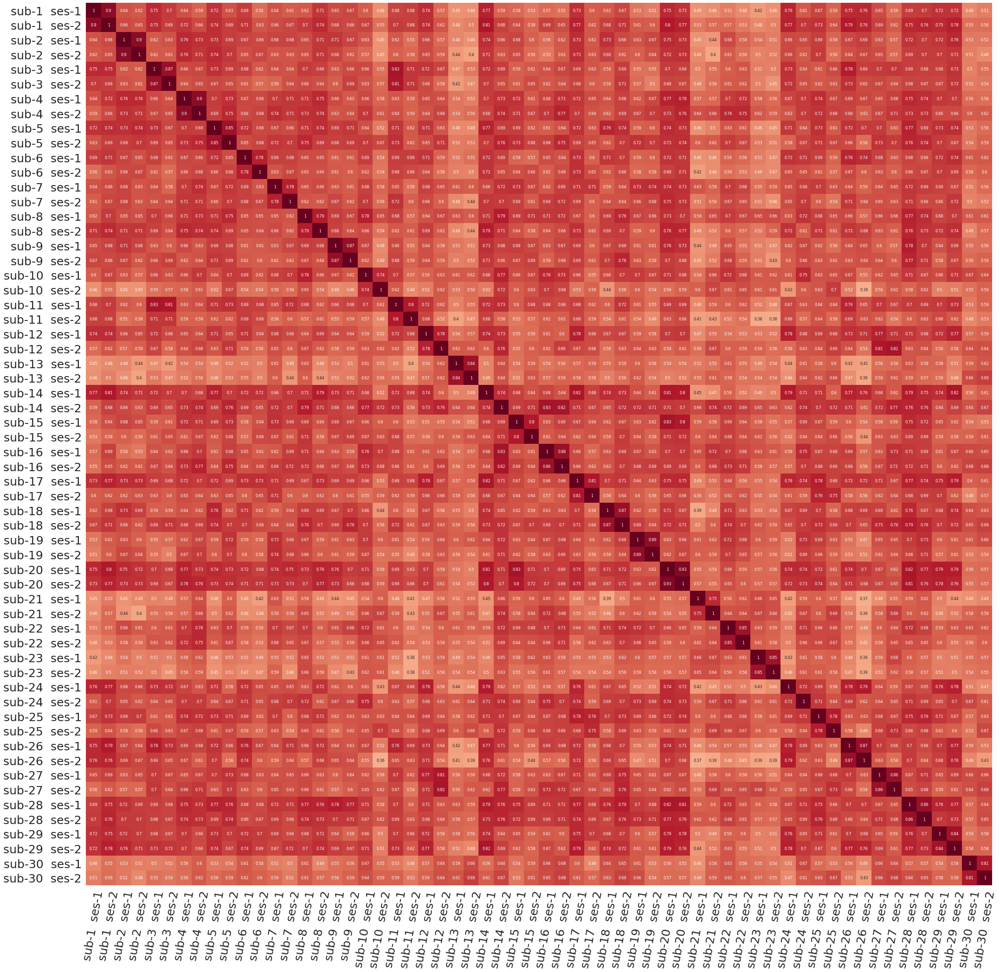

In [ ]:
# corr across subject 30*30

corr_names = []

for i in range(30):
  for j in range(1,3):
    corr_names.append('sub-'+str(i+1) + '  ses-' + str(j))


data1 = []
for i in  range(30):
  data1.append(abs(pearson_corr_append_gsr[0][i]).flatten()) # optimal_scale_X_append_nogsr
  data1.append(abs(pearson_corr_append_gsr[1][i]).flatten())

corr_data = data1

corrs = np.zeros((len(corr_data),len(corr_data))) 
for i in range(len(corr_data)):
  for j in range(len(corr_data)):
    corr,_ = spearmanr(corr_data[i],corr_data[j])
    corrs [i, j] = round(corr,3)


sns.set(rc={'figure.figsize':(35,35)})  
fig, ax = plt.subplots(1)
g= sns.heatmap(corrs,xticklabels=corr_names, yticklabels=corr_names, vmax = 1, vmin = -1,annot=True,annot_kws={"size": 8}, cmap='RdBu_r', cbar=False)
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 25)
g.set_xticklabels(g.get_xticklabels(), rotation = 80, fontsize = 25)

In [ ]:
# calculate corr between two sessions 
# indivisual corr of between subject

data1 = []
for i in  range(30):
  data1.append(abs(test_statistic_append_gsr[0][i]).flatten())

data2 = []
for i in  range(30):
  data2.append(abs(test_statistic_append_gsr[1][i]).flatten())

corrs_1 = np.zeros((len(data1),len(data1))) 
for i in range(len(data1)):
  for j in range(len(data1)):
    corr,_ = spearmanr(data1[i],data1[j])
    corrs_1 [i, j] = round(corr,5)

corrs_2 = np.zeros((len(data1),len(data1))) 
for i in range(len(data1)):
  for j in range(len(data1)):
    corr,_ = spearmanr(data2[i],data2[j])
    corrs_2 [i, j] = round(corr,5)


corrs_1_triu = corrs_1[np.triu_indices(30, k = 1)]
corrs_2_triu = corrs_2[np.triu_indices(30, k = 1)]

print(spearmanr(corrs_1_triu,corrs_2_triu))
print(pearsonr(corrs_1_triu,corrs_2_triu))

SpearmanrResult(correlation=0.5083346402440724, pvalue=5.830421320260796e-30)
(0.536715508460209, 8.031477042345202e-34)


In [ ]:
# corr avg function: calculate corr, then avg across 30 subjects
# corr_data1: sub*parcel(180)
def corr_avg_by_sub(corr_data1, corr_data2):
  corrs = []
  for i in range(30):
    # # homo
    corr,_ = spearmanr(corr_data1[i],corr_data2[i])
    corrs.append(corr)
  # exclude nan
  corrs = [x for x in corrs if ~np.isnan(x)]
  corr_avg = np.mean(corrs)
  return corr_avg

[Text(0.5, 0, ' pearsonr - ses1'),
 Text(1.5, 0, ' pearsonr - ses2'),
 Text(2.5, 0, ' MGCX R - ses1'),
 Text(3.5, 0, ' MGCX R - ses2'),
 Text(4.5, 0, ' optimal scale X - ses1'),
 Text(5.5, 0, ' optimal scale X - ses2'),
 Text(6.5, 0, ' optimal scale Y - ses1'),
 Text(7.5, 0, ' optimal scale Y - ses2'),
 Text(8.5, 0, ' pearsonr - ses1'),
 Text(9.5, 0, ' pearsonr - ses2'),
 Text(10.5, 0, ' MGCX R - ses1'),
 Text(11.5, 0, ' MGCX R - ses2'),
 Text(12.5, 0, ' optimal scale X - ses1'),
 Text(13.5, 0, ' optimal scale X - ses2'),
 Text(14.5, 0, ' optimal scale Y - ses1'),
 Text(15.5, 0, ' optimal scale Y - ses2')]

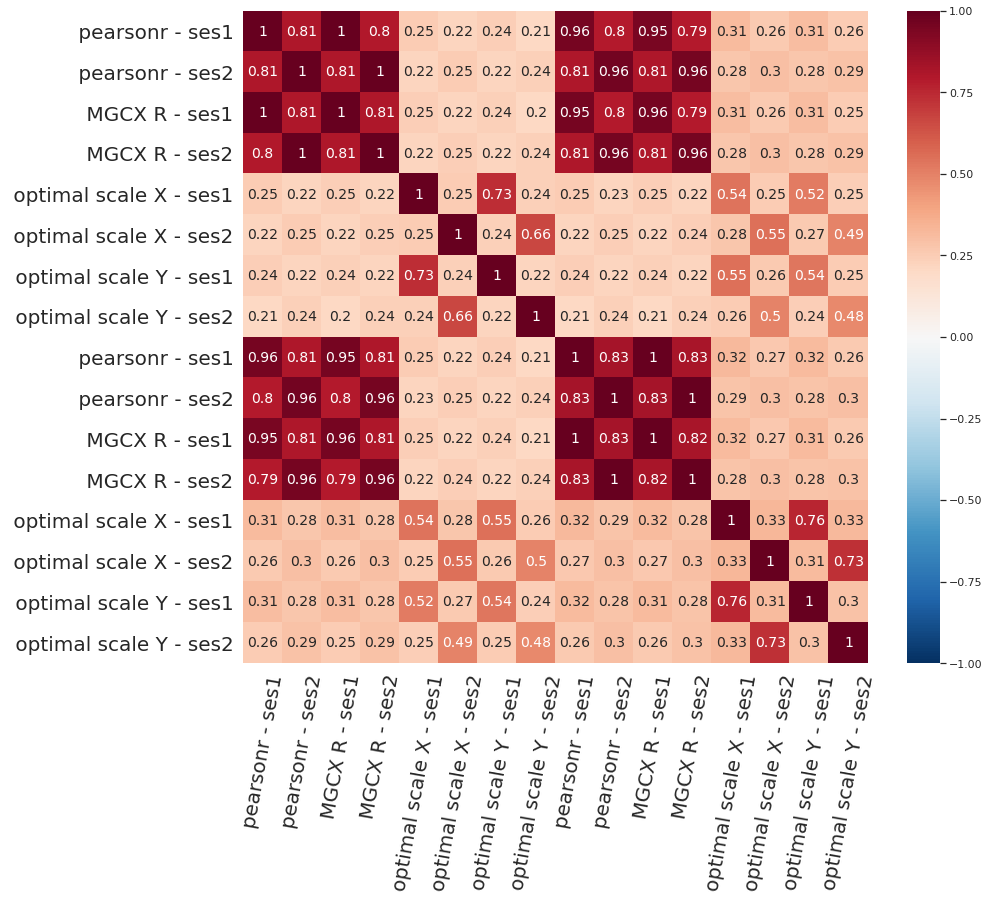

In [ ]:
# calculate corr, then avg across 30 subjects

pearson_corr_abs = abs(pearson_corr_append[0])
pearson_corr_abs_2 = abs(pearson_corr_append[1])

#M=0 ses 1 and 2
# corr_names= ['abs-pearsonr','MGCX-R(M=0)','optimal_scale_X(M=0)','abs-pearsonr','MGCX-R(M=0)','optimal_scale_X(M=0)']

# corr_data = [pearson_corr_abs,test_statistic_append[0],optimal_scale_X_append[0], pearson_corr_abs_2,test_statistic_append[1],optimal_scale_X_append[1]]

corr_names = []
for i in range(len(pearson_corr_append_nogsr)):
  corr_names.append(' pearsonr - ses1')
  corr_names.append(' pearsonr - ses2')
  corr_names.append(' MGCX R - ses1')
  corr_names.append(' MGCX R - ses2')
  corr_names.append(' optimal scale X - ses1')
  corr_names.append(' optimal scale X - ses2')
  corr_names.append(' optimal scale Y - ses1')
  corr_names.append(' optimal scale Y - ses2')

corr_data = []
for i in range(len(pearson_corr_append_nogsr)):
  corr_data.append(abs(pearson_corr_append_nogsr[i]))
for i in range(len(pearson_corr_append_nogsr)):
  corr_data.append(abs(test_statistic_append_nogsr[i]))
for i in range(len(pearson_corr_append_nogsr)):
  corr_data.append(abs(optimal_scale_X_append_nogsr[i]))
for i in range(len(pearson_corr_append_nogsr)):
  corr_data.append(abs(optimal_scale_Y_append_nogsr[i]))
for i in range(len(pearson_corr_append_gsr)):
  corr_data.append(abs(pearson_corr_append_gsr[i]))
for i in range(len(pearson_corr_append_gsr)):
  corr_data.append(abs(test_statistic_append_gsr[i]))
for i in range(len(pearson_corr_append_gsr)):
  corr_data.append(abs(optimal_scale_X_append_gsr[i]))
for i in range(len(pearson_corr_append_gsr)):
  corr_data.append(abs(optimal_scale_Y_append_gsr[i]))


corrs = np.zeros((len(corr_data),len(corr_data))) 
for i in range(len(corr_data)):
  for j in range(len(corr_data)):
    # dmn
    # mask = ~np.isnan(p_value_append[0])
    # corr_avg = corr_avg_by_sub(corr_data[i][mask].reshape(30,359),corr_data[j][mask].reshape(30,359))
    # # hmo
    corr_avg = corr_avg_by_sub(corr_data[i], corr_data[j])
    corrs [i, j] = round(corr_avg,5)


sns.set(rc={'figure.figsize':(14,12)})  
fig, ax = plt.subplots(1)
g= sns.heatmap(corrs,xticklabels=corr_names, yticklabels=corr_names, vmax = 1, vmin = -1,annot=True,annot_kws={"size": 14}, cmap='RdBu_r')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 20)
g.set_xticklabels(g.get_xticklabels(), rotation = 80, fontsize = 20)


[Text(0.5, 0, 'abs-pearsonr'),
 Text(1.5, 0, 'MGCX-R(M=0)'),
 Text(2.5, 0, 'optimal_scale_X(M=0)'),
 Text(3.5, 0, 'abs-pearsonr'),
 Text(4.5, 0, 'MGCX-R(M=0)'),
 Text(5.5, 0, 'optimal_scale_X(M=0)')]

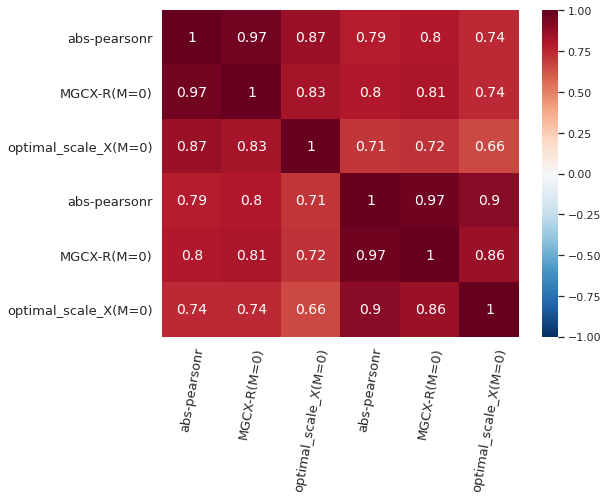

In [ ]:
# avg across 30 subjects, then calculate corr

pearson_corr_abs = abs(pearson_corr_append[0])
pearson_corr_abs_2 = abs(pearson_corr_append[1])

#M=0 ses 1 and 2
corr_names= ['abs-pearsonr','MGCX-R(M=0)','optimal_scale_X(M=0)','abs-pearsonr','MGCX-R(M=0)','optimal_scale_X(M=0)']
#avg across 30sub
corr_data = [np.mean(pearson_corr_abs,axis=0),
             np.mean(test_statistic_append[0],axis=0), 
             np.mean(optimal_scale_X_append[0],axis=0), 
             np.mean(pearson_corr_abs_2,axis=0), 
             np.mean(test_statistic_append[1],axis=0), 
             np.mean(optimal_scale_X_append[1],axis=0)]

corrs = np.zeros((len(corr_data),len(corr_data))) #avg 30sub
for i in range(len(corr_data)):
  for j in range(len(corr_data)):
    # dmn
    mask = ~np.isnan(p_value_append[0][0])
    corr,_ = spearmanr(corr_data[i][mask],corr_data[j][mask])
    # # hmo
    # corr,_ = spearmanr(corr_data[i],corr_data[j])
    corrs [i, j] = round(corr,3)


sns.set(rc={'figure.figsize':(8,6)})  
fig, ax = plt.subplots(1)
g= sns.heatmap(corrs,xticklabels=corr_names, yticklabels=corr_names, vmax = 1, vmin = -1,annot=True,annot_kws={"size": 14}, cmap='RdBu_r')
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 13)
g.set_xticklabels(g.get_xticklabels(), rotation = 80, fontsize = 13)


# AR model - partial auto corr

## run AR

In [ ]:
from statsmodels.graphics.tsaplots import _prepare_data_corr_plot
from statsmodels.tsa.stattools import acf, pacf
def ar_lag(x):
    zero=True
    alpha = 0.05
    lags = 15
    unbiased=False
    fft=False
    lags, nlags, irregular = _prepare_data_corr_plot(x, lags, zero)
    if alpha is None:
        acf_x = acf(x, nlags=nlags, alpha=alpha, fft=fft,
                    unbiased=unbiased)
    else:
        acf_x, confint = acf(x, nlags=nlags, alpha=alpha, fft=fft,
                                unbiased=unbiased)
    
    lower = confint[:, 0] - acf_x
    upper = confint[:, 1] - acf_x
    for i in range(len(acf_x)):
      if upper[i]<acf_x[i]:
        select_lag = i
        continue
      else:
        select_lag = i
        break

    return select_lag

In [ ]:
    # alpha : float, optional
    #     If a number is given, the confidence intervals for the given level are
    #     returned. For instance if alpha=.05, 95 % confidence intervals are
    #     returned where the standard deviation is computed according to
    #     1/sqrt(len(x))

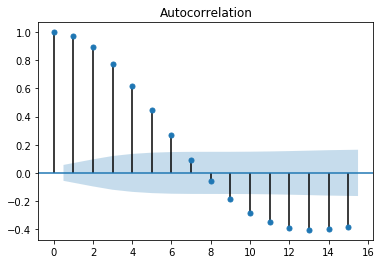

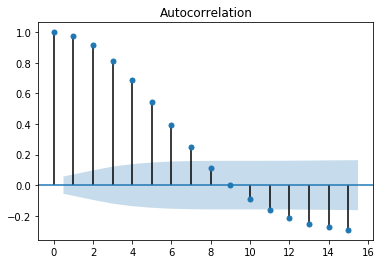

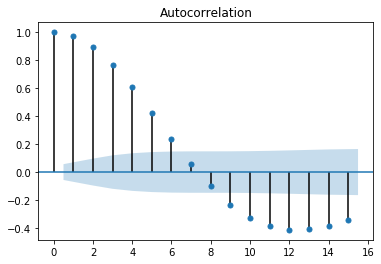

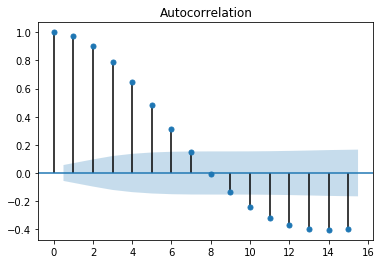

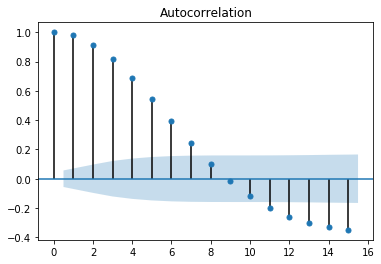

In [ ]:
for target_parcel in range(5):
  X = data[0:tr,target_parcel].reshape(tr, 1) 
  sm.graphics.tsa.plot_acf(X,lags=15)
  plt.show()

In [ ]:
# 07/20/20 autocorr

sub_id = [103818, 105923, 111312, 114823, 115320, 122317, 125525, 135528, 137128, 139839, 144226, 146129, 149337, 158035, 172332, 177746, 185442, 187547, 192439, 194140, 195041, 200109, 204521, 287248, 601127, 660951, 783462, 859671, 861456, 917255]
# Parameters.	
M = 0	    
tr = 1200

trt = ['test']
ses = ['rfMRI_REST1_LR', 'rfMRI_REST2_LR']

def worker(ses_id,trt_id,sub_index,parcel_index):	
    # nogsr
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_LR/nogsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/%s/%s/%s/nogsr/%s_Atlas_MSMAll_hp2000_clean_24nuisance.reg_lin.trend_filt_sm6.ptseries.nii'% (trt_id,str(sub_id[sub_index]),ses_id,ses_id ))
    # gsr
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/test/%s/rfMRI_REST1_LR/gsr/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% str(sub_id[sub_index]))
    # img = nib.load('/gdrive/My Drive/CMI/Project/MGCX/data/HCP_trt_07012020/HCP_trt/%s/%s/%s/gsr/%s_Atlas_MSMAll_hp2000_clean_24nuisance.gsr.reg_lin.trend_filt_sm6.ptseries.nii'% (trt_id,str(sub_id[sub_index]),ses_id,ses_id ))

    data = np.array(img.get_fdata())
    #zscore
    axis= 0
    data = zscore(data,axis=axis) 

    x = data[0:tr,parcel_index].reshape(tr, 1) 
    lag = ar_lag(x)
	
    output = (sub_index, parcel_index, lag)

    return(output)
	
for ses_id in ses:
  for trt_id in trt:

    result = Parallel(n_jobs=200, verbose=10)(delayed(worker)(ses_id,trt_id, sub_index, parcel_index) for sub_index in range(30) for parcel_index in range(360))	
    # nogsr
    filename = 'auto_corr_lag_tr%d_%s_%s_nogsr.pkl' % (tr,trt_id,ses_id)
    # gsr
    # filename = 'auto_corr_lag_tr%d_%s_%s_gsr.pkl' % (tr,trt_id,ses_id)


    output_file = open(filename, 'wb')	
    pickle.dump(result, output_file)	
    output_file.close()

    from google.colab import files
    # nogsr
    files.download('auto_corr_lag_tr%d_%s_%s_nogsr.pkl' % (tr,trt_id,ses_id))
    # gsr
    # files.download('auto_corr_lag_tr%d_%s_%s_gsr.pkl' % (tr,trt_id,ses_id))




## read AR data


In [ ]:
# 07/13/2020 hcp dmn connectivity 180

p = 360         
tr = 1200
sub_list_length = 30      

lag_append = []

M = 0
# Read files and combine into matrix.
trt = ['test']
ses = ['rfMRI_REST1_LR', 'rfMRI_REST2_LR']
for trt_id in trt:
  for ses_id in ses:

    lag = np.zeros((sub_list_length,p))

    # AR
    # nogsr
    filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/AR-autocorr_new/auto_corr_lag_tr%d_%s_%s_nogsr.pkl" % (tr,trt_id,ses_id)
    # gsr
    # filename = "/gdrive/My Drive/CMI/Project/MGCX/result/HCP_trt/AR-autocorr_new/auto_corr_lag_tr%d_%s_%s_nogsr.pkl" % (tr,trt_id,ses_id)
    pickle_in = open(filename,"rb")
    results = np.asarray(pickle.load(pickle_in))
    for result in results:
        # output = (sub_index, parcel_index, lag)
        k = int(result[0])
        l = int(result[1])
        lag[k,l] = result[2]

    lag_append.append(lag)

lag_all = np.vstack(lag_append)


## heatmap

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version,

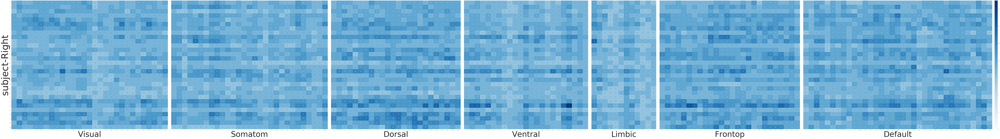

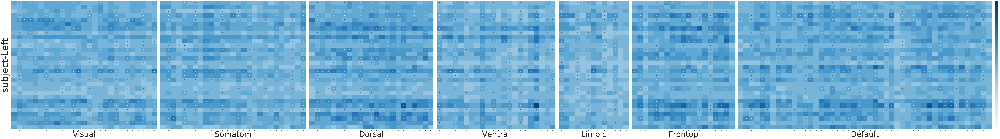

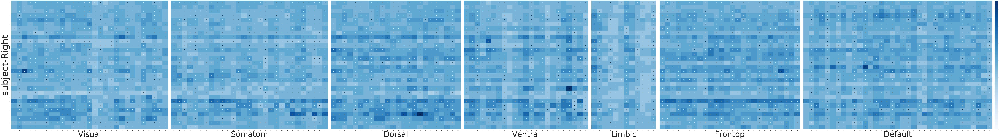

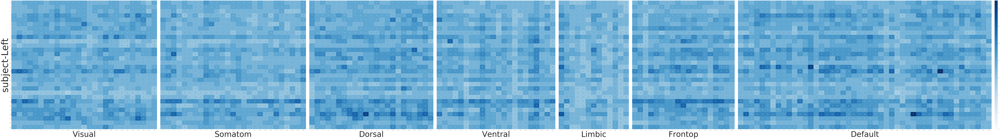

In [ ]:
# trt = ['test', 'retest']
# ses = ['rfMRI_REST1_LR', 'rfMRI_REST1_RL','rfMRI_REST2_LR','rfMRI_REST2_RL']
trt = ['test']
ses = ['rfMRI_REST1_LR', 'rfMRI_REST2_LR']
%matplotlib notebook
%matplotlib inline
sub_list_length = 30  # Ting31.list - exclude one subject

cmap = 'Blues' #'seismic','gnuplot','binary'
vmax = 15
vmin = 0

for trt_i, trt_id in enumerate(trt):
  for ses_j,ses_id in enumerate(ses):
    roi_R = [[]]*7
    roi_L = [[]]*7
    for k in range(7): 
      roi_R[k] = np.zeros((sub_list_length, np.count_nonzero(roi_labels_R == k+1)))
      roi_L[k] = np.zeros((sub_list_length, np.count_nonzero(roi_labels_L == k+1)))
      for i in range(sub_list_length):
        mask_R = np.where(roi_labels_R==k+1)
        mask_L = np.where(roi_labels_L==k+1)
        if trt_i == 0:
          data_roi_R = lag_append[ses_j][:,0:180]
          data_roi_L = lag_append[ses_j][:,180:360]
        if trt_i == 1:
          data_roi_R = lag_append[ses_j+len(ses)][:,0:180]
          data_roi_L = lag_append[ses_j+len(ses)][:,180:360]
        roi_R[k][i] = data_roi_R[i][mask_R]
        roi_L[k][i] = data_roi_L[i][mask_L]

    roi_label_name=['Visual','Somatom','Dorsal','Ventral','Limbic','Frontop', 'Default']

    sns.set(rc={'figure.figsize':(180,25)})  
    fig = plt.figure(constrained_layout=True)
    # fig.suptitle(trt_id+' '+ ses_id , fontsize=16)

    widths = []
    for k in range(7):
      widths = np.append(widths, roi_R[k].shape[1])

    heights = [sub_list_length]
    spec = fig.add_gridspec(ncols=7, nrows=1, width_ratios=widths, height_ratios=heights)

    # optimal scale
    for col in range(7):
        ax = fig.add_subplot(spec[0, col])
        if col in range(1,6):
          g = sns.heatmap(roi_R[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin,cbar=False)
          g.set(yticklabels=[])
        if col==0:
          g = sns.heatmap(roi_R[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin,cbar=False)
          ax.set_ylabel('subject-Right', fontsize = 120) #ax.set_ylabel('Subject', fontsize = 80) 
        if col == 6:
          g = sns.heatmap(roi_R[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin, cbar=True, cbar_kws={'aspect':300,'pad':0.01}) #pad=0.01, shrink=0.8, fraction=0.1
          g.set(yticklabels=[])
          # g.tick_params(labelsize=60)
        ax.set_xlabel(str(roi_label_name[col]), fontsize = 100) #fontsize = 80
    
    sns.set(rc={'figure.figsize':(180,25)})  
    fig = plt.figure(constrained_layout=True)
    widths = []
    for k in range(7):
      widths = np.append(widths, roi_L[k].shape[1])
    heights = [sub_list_length]
    spec = fig.add_gridspec(ncols=7, nrows=1, width_ratios=widths, height_ratios=heights)

    for col in range(7):
        ax = fig.add_subplot(spec[0, col])
        if col in range(1,6):
          g = sns.heatmap(roi_L[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin,cbar=False)
          g.set(yticklabels=[])
        if col==0:
          g = sns.heatmap(roi_L[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin,cbar=False)
          ax.set_ylabel('subject-Left', fontsize = 120) #ax.set_ylabel('Subject', fontsize = 80) 
        if col == 6:
          g = sns.heatmap(roi_L[col],annot=True,cmap=cmap,vmax=vmax,vmin=vmin, cbar=True, cbar_kws={'aspect':300,'pad':0.01}) #pad=0.01, shrink=0.8, fraction=0.1
          g.set(yticklabels=[])
          # g.tick_params(labelsize=60)
        ax.set_xlabel(str(roi_label_name[col]), fontsize = 100) #fontsize = 80

## plot on hemi


In [ ]:
print(np.max(lag_all))
print(np.min(lag_all))
optimal_scale_X_mean = np.mean(lag_append[0],axis=0)
print(np.max(optimal_scale_X_mean),np.min(optimal_scale_X_mean))

15.0
5.0
8.766666666666667 6.4


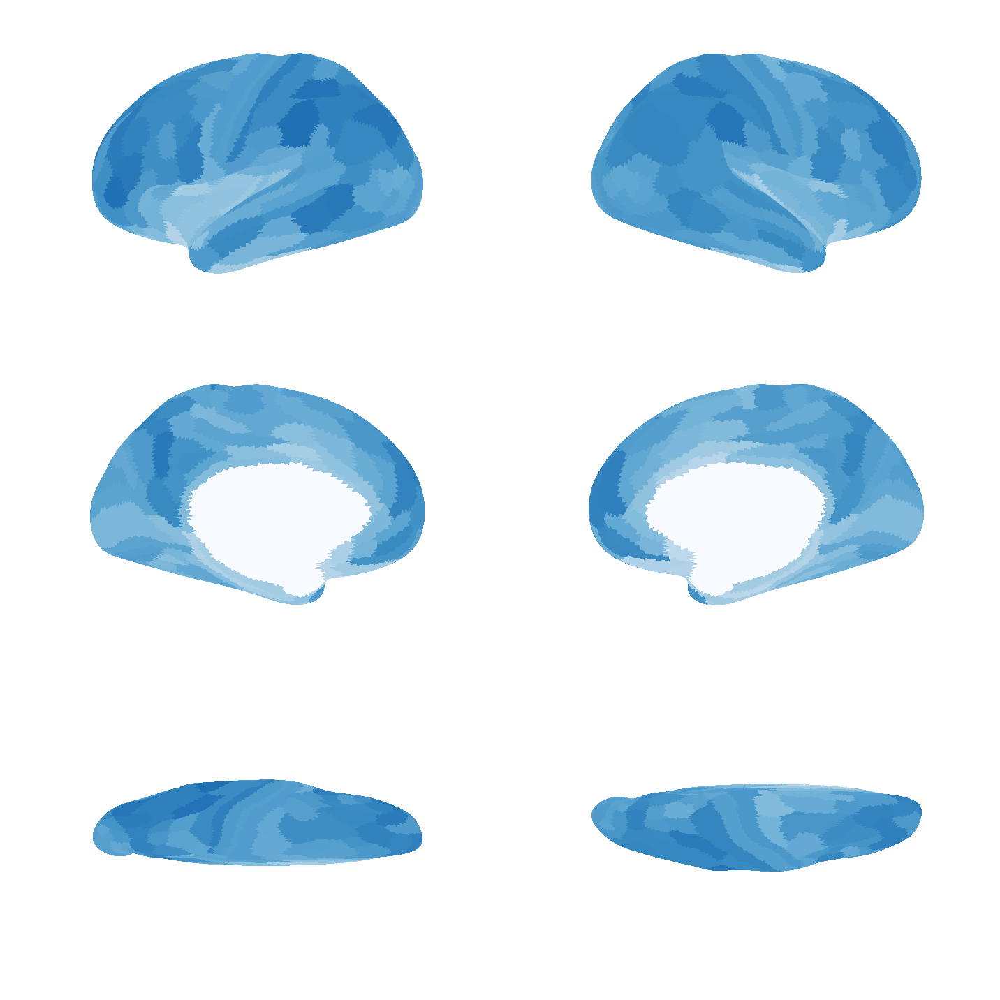

In [ ]:
%matplotlib inline
wdir = '/gdrive/My Drive/CMI/Project/MGCX/data'
parcel_label = plabel = '%s/HCP_MMP_P210_10k.dlabel.nii' % wdir
rightsurface = rsurf='/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.R.very_inflated.10k_fs_LR.surf.gii'
leftsurface = lsurf = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/Conte69.L.very_inflated.10k_fs_LR.surf.gii'
# '/gdrive/My Drive/CMI/Project/MGCX/data/fsaverage5.L.midthickness.surf.gii'

optimal_scale_X_mean = np.mean(lag_append[0],axis=0)
img_optimal_scale_X_mean = parcel2vert(wdir,lsurf,parcel_label,optimal_scale_X_mean[180:360].reshape(1,180))
img_optimal_scale_X_mean_r = parcel2vert_r(wdir,rsurf,parcel_label,optimal_scale_X_mean[0:180].reshape(1,180))

cmap = 'Blues' #'seismic', 'gnuplot', gist_heat_r, 'binary','bone_r'
vmax = 10
vmin = 5
j=1
plt.figure(figsize=(20,20))
views = ['lateral', 'medial', 'dorsal']
bg_map = '/gdrive/My Drive/CMI/Project/MGCX/data/10k/S1200.L.curvature_MSMAll.10k_fs_LR.func.gii'

for v in views:
    ax = plt.subplot(3,2,2*j-1, projection='3d')
    plotting.plot_surf(leftsurface, img_optimal_scale_X_mean, bg_map=bg_map, hemi='left',view = v, cmap = cmap, colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
    
    ax = plt.subplot(3,2,2*j, projection='3d')
    plotting.plot_surf(rightsurface, img_optimal_scale_X_mean_r, bg_map=bg_map, hemi='right',view = v, cmap = cmap, colorbar = False, vmin = vmin, vmax = vmax, avg_method = 'median', alpha = 1, darkness = 1, symmetric_cmap=False,axes=ax)
    
    j+=1

plt.tight_layout()
plt.show()





